In [26]:
from DIP_UNET_models.unet_and_tv.mri_model import MRIModel
from DIP_UNET_models.unet_and_tv.unet_model import UnetModel
from DIP_UNET_models.unet_and_tv.train_unet import UnetMRIModel
import torch
import pytorch_lightning
import numpy as np
import matplotlib.pyplot as plt
from include import *
import h5py
from common.subsample import MaskFunc
from pytorch_msssim import ms_ssim
from DIP_UNET_models.unet_and_tv.common.evaluate import ssim,psnr
from common.evaluate import vifp_mscale
import glob
import warnings
warnings.filterwarnings("ignore")

dtype = torch.cuda.FloatTensor
gpu = 1
torch.cuda.set_device(gpu)

In [27]:
def hist_match(source, template):
    """
    Adjust the pixel values of a grayscale image such that its histogram
    matches that of a target image

    Arguments:
    -----------
        source: np.ndarray
            Image to transform; the histogram is computed over the flattened
            array
        template: np.ndarray
            Template image; can have different dimensions to source
    Returns:
    -----------
        matched: np.ndarray
            The transformed output image
    """

    oldshape = source.shape
    source = source.ravel()
    template = template.ravel()

    # get the set of unique pixel values and their corresponding indices and
    # counts
    s_values, bin_idx, s_counts = np.unique(source, return_inverse=True,
                                            return_counts=True)
    t_values, t_counts = np.unique(template, return_counts=True)

    # take the cumsum of the counts and normalize by the number of pixels to
    # get the empirical cumulative distribution functions for the source and
    # template images (maps pixel value --> quantile)
    s_quantiles = np.cumsum(s_counts).astype(np.float64)
    s_quantiles /= s_quantiles[-1]
    t_quantiles = np.cumsum(t_counts).astype(np.float64)
    t_quantiles /= t_quantiles[-1]

    # interpolate linearly to find the pixel values in the template image
    # that correspond most closely to the quantiles in the source image
    interp_t_values = np.interp(s_quantiles, t_quantiles, t_values)

    return interp_t_values[bin_idx].reshape(oldshape)

### create fake args to initialize a UnetMRIModel

In [28]:
class args():
    def __init__(self):
        self.num_pools = 4
        self.drop_prob = 0
        self.num_chans = 32

In [29]:
args = args()

In [30]:
umdl = UnetMRIModel(args)

### checkpoint loading

In [31]:
checkpoint = torch.load("UNET_intermed/unet/version_1/checkpoints/epoch=49.ckpt")

In [32]:
umdl.load_state_dict(checkpoint['state_dict'])
umdl.cuda(gpu)
"loading done."

'loading done.'

### Loop over all validation data points
to make sure the rest of the code is working, refer to [sample test](#sample_test).

In [8]:
wfats = ["file1000000.h5","file1000325.h5","file1000555.h5","file1000026.h5"]
wofats = ["file1001585.h5","file1000033.h5","file1000885.h5","file1001977.h5"]
files = wfats + wofats
random.shuffle(files)

c = 0
for filename in files:
    filename = "/hdd/multicoil_val/" + filename
    f = h5py.File(filename, 'r')
    c += f["kspace"].shape[0]
c

256

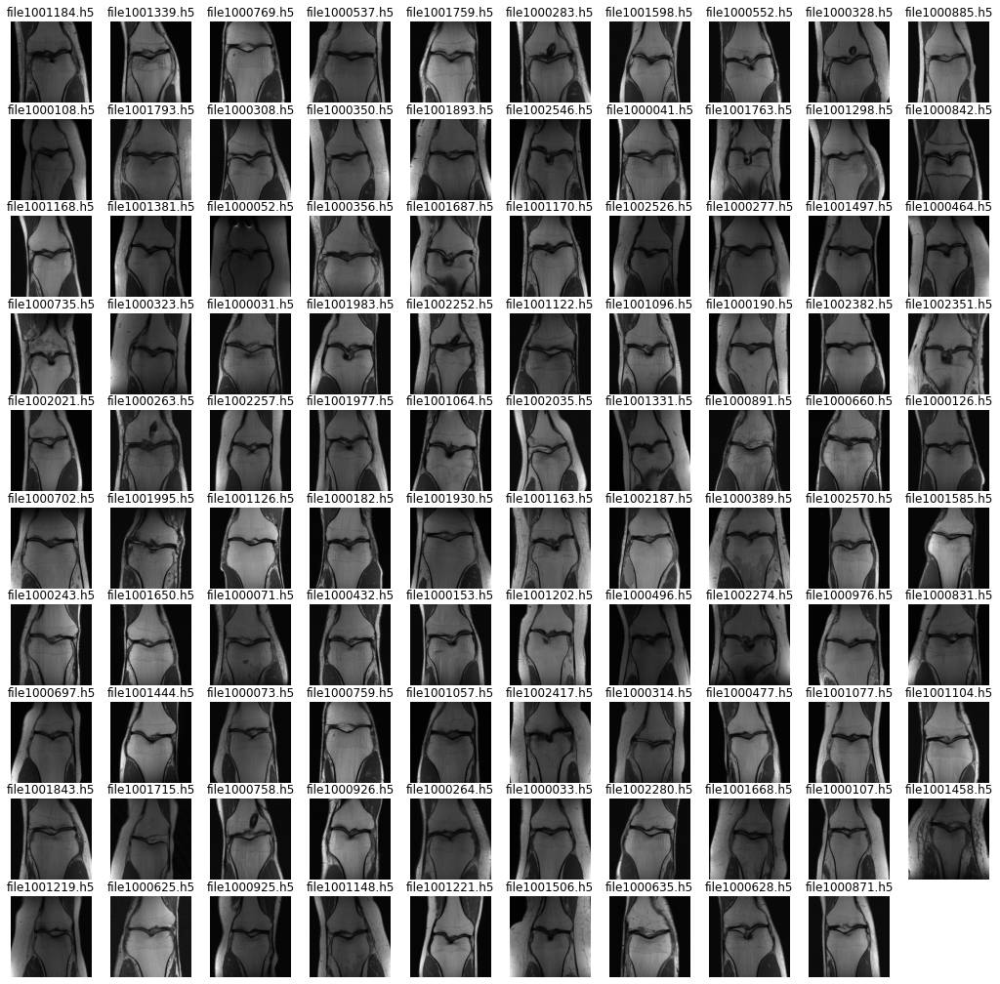

In [87]:
fig = plt.figure(figsize=(18,18))
#files = glob.glob("/hdd/multicoil_val/*")
files = pd.copy()
for i,file in enumerate(files):
    ax = fig.add_subplot(10,10,i+1)
    f = h5py.File("/hdd/multicoil_val/"+file,"r")["reconstruction_rss"]
    nu = f.shape[0]//2
    ax.imshow(f[nu],"gray")
    ax.set_title(file.split('/')[-1])
    ax.axis("off")
plt.show()

In [86]:
pd = ["file1001184.h5","file1001339.h5","file1000769.h5","file1000537.h5","file1001759.h5","file1000283.h5",
      "file1001598.h5","file1000552.h5","file1000328.h5","file1000885.h5","file1000108.h5","file1001793.h5",
      "file1000308.h5","file1000350.h5","file1001893.h5","file1002546.h5","file1000041.h5","file1001763.h5",
      "file1001298.h5","file1000842.h5","file1001168.h5","file1001381.h5","file1000052.h5","file1000356.h5",
      "file1001687.h5","file1001170.h5","file1002526.h5","file1000277.h5","file1001497.h5","file1000464.h5",
      "file1000735.h5","file1000323.h5","file1000031.h5","file1001983.h5","file1002252.h5","file1001122.h5",
      "file1001096.h5","file1000190.h5","file1002382.h5","file1002351.h5","file1002021.h5","file1000263.h5",
      "file1002257.h5","file1001977.h5","file1001064.h5","file1002035.h5","file1001331.h5","file1000891.h5",
      "file1000660.h5","file1000126.h5","file1000702.h5","file1001995.h5","file1001126.h5","file1000182.h5",
      "file1001930.h5","file1001163.h5","file1002187.h5","file1000389.h5","file1002570.h5","file1001585.h5",
      "file1000243.h5","file1001650.h5","file1000071.h5","file1000432.h5","file1000153.h5","file1001202.h5",
      "file1000496.h5","file1002274.h5","file1000976.h5","file1000831.h5","file1000697.h5","file1001444.h5",
      "file1000073.h5","file1000759.h5","file1001057.h5","file1002417.h5","file1000314.h5","file1000477.h5",
      "file1001077.h5","file1001104.h5","file1001843.h5","file1001715.h5","file1000758.h5","file1000926.h5",
      "file1000264.h5","file1000033.h5","file1002280.h5","file1001668.h5","file1000107.h5","file1001458.h5",
      "file1001219.h5","file1000625.h5","file1000925.h5","file1001148.h5","file1001221.h5","file1001506.h5",
      "file1000635.h5","file1000628.h5","file1000871.h5"]

In [71]:
filename = "/hdd/multicoil_val/" + "file1001585.h5"
f = h5py.File(filename, 'r') # contains a kspace measurement f['kspace'] and rss reconstruction f['reconstruction_rss']

# which slice to consider in the following
slicenu = f["kspace"].shape[0]//2

slice_ksp = f['kspace'][slicenu]
slice_ksp_torchtensor = transform.to_tensor(slice_ksp)      # Convert from numpy array to pytorch tensor

##### create a random mask #####
try: # if the file already comes with a mask
    temp = np.array([1 if e else 0 for e in f["mask"]])
    temp = temp[np.newaxis].T
    temp = np.array([[temp]])
    mask = transform.to_tensor(temp).type(dtype).detach().cpu()
except: # if we need to create a mask
    desired_factor = 4
    undersampling_factor = 0
    tolerance = 0.03
    while undersampling_factor < desired_factor - tolerance or undersampling_factor > desired_factor + tolerance:
        mask_func = MaskFunc(center_fractions=[0.07], accelerations=[desired_factor])  # Create the mask function object
        masked_kspace, mask = transform.apply_mask(slice_ksp_torchtensor, mask_func=mask_func)   # Apply the mask to k-space
        mask1d = var_to_np(mask)[0,:,0]
        undersampling_factor = len(mask1d) / sum(mask1d)

mask1d = var_to_np(mask)[0,:,0]

# The provided mask and data have last dim of 368, but the actual data is smaller.
# To prevent forcing the network to learn outside the data region, we force the mask to 0 there.
#mask1d[:mask1d.shape[-1]//2-160] = 0 
#mask1d[mask1d.shape[-1]//2+160:] =0
mask2d = np.repeat(mask1d[None,:], slice_ksp.shape[1], axis=0).astype(int) # Turning 1D Mask into 2D that matches data dimensions
mask2d = np.pad(mask2d,((0,),((slice_ksp.shape[-1]-mask2d.shape[-1])//2,)),mode='constant') # Zero padding to make sure dimensions match up
mask = transform.to_tensor( np.array( [[mask2d[0][np.newaxis].T]] ) ).type(dtype).detach().cpu()

#f.close()

##### sample the k-space #####
masked_kspace, mask = transform.apply_mask(slice_ksp_torchtensor, mask = mask)
unders_measurement = np_to_var( masked_kspace.data.cpu().numpy() ).type(dtype)

##### prepare the input for UNET #####
image = transforms.ifft2(masked_kspace)
# Crop input image to given resolution if larger
smallest_width = min(320, image.shape[-2])
smallest_height = min(320, image.shape[-3])

crop_size = (smallest_height, smallest_width)
image = transforms.complex_center_crop(image, crop_size)
# Absolute value
image = transforms.complex_abs(image)
# Apply Root-Sum-of-Squares if multicoil data
image = transforms.root_sum_of_squares(image)
# Normalize input
image, mean, std = transforms.normalize_instance(image, eps=1e-11)
image = image.clamp(-6, 6)

### normalize target
orig = f["reconstruction_rss"][slicenu]
orig = transforms.to_tensor(orig)
orig = transforms.center_crop(orig, (320,320))
orig = transforms.normalize(orig, mean, std, eps=1e-11)
#orig = torch.from_numpy(orig)
orig = orig.clamp(-6, 6)
orig = orig.data.cpu().numpy()

##### get the UNET output #####
out = umdl( torch.from_numpy(np.array([image.data.cpu().numpy()])).type(dtype) )
out_np = out.data.cpu().numpy()[0]

##### balance the dynamic range for score computation #####
mean = mean.data.cpu().numpy()[np.newaxis][0]
std = std.data.cpu().numpy()[np.newaxis][0]
##### scores ######
orig = orig*std+mean
rec = out_np*std+mean

im1 = orig.copy()
im2 = rec.copy()
#im1 = (im1-im1.min()) / (im1.max()-im1.min())
#im2 = (im2-im2.min()) / (im2.max()-im2.min())

#im2 = hist_match(im2,im1)
im1 = (im1-im1.mean()) / (im1.std())
im2 = (im2-im2.mean()) / (im2.std())
#M = max(abs(im1.min()),abs(im2.min()))
#im1 += M
#im2 += M

### hist match

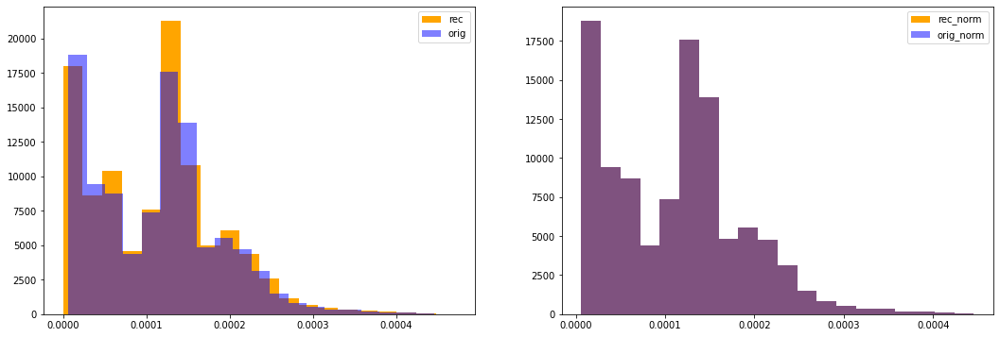

In [36]:
fig = plt.figure(figsize=(18,6))
ax = fig.add_subplot(121)
ax.hist(rec.ravel(),bins=20,color="orange",label="rec")
ax.hist(orig.ravel(),bins=20,alpha=0.5,color="blue",label="orig")
ax.legend()
ax = fig.add_subplot(122)
ax.hist(im2.ravel(),bins=20,color="orange",label="rec_norm")
ax.hist(im1.ravel(),bins=20,alpha=0.5,color="blue",label="orig_norm")
ax.legend()
plt.show()

### mean-std

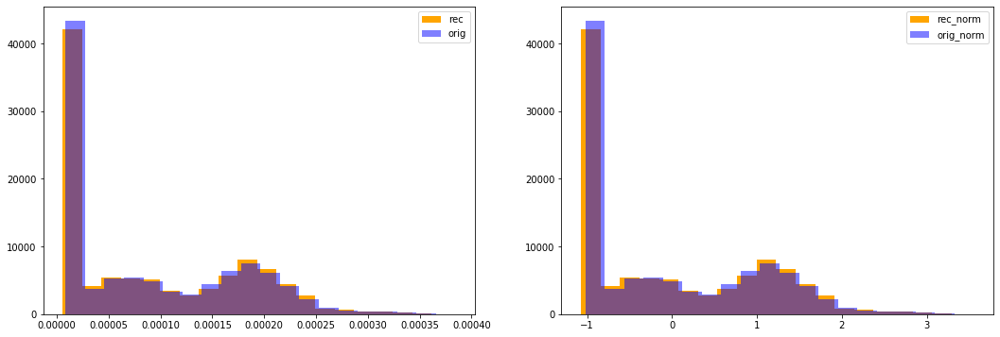

In [72]:
fig = plt.figure(figsize=(18,6))
ax = fig.add_subplot(121)
ax.hist(rec.ravel(),bins=20,color="orange",label="rec")
ax.hist(orig.ravel(),bins=20,alpha=0.5,color="blue",label="orig")
ax.legend()
ax = fig.add_subplot(122)
ax.hist(im2.ravel(),bins=20,color="orange",label="rec_norm")
ax.hist(im1.ravel(),bins=20,alpha=0.5,color="blue",label="orig_norm")
ax.legend()
plt.show()

In [ ]:
import seaborn as sns
def sinplot(im1,im2,norm_type):
    plt.hist(im1.ravel(),bins=20,alpha=0.8,color = "blue",label="original")
    plt.hist(im2.ravel(),bins=20,alpha=0.5,color="orangered",label="reconstruction")
    plt.title(norm_type)
    
f = plt.figure(figsize=(14, 8))
gs = f.add_gridspec(2, 2)

with sns.axes_style("darkgrid"):
    ax = f.add_subplot(gs[0, 0])
    sinplot(orig,rec,"no norm")

with sns.axes_style("white"):
    ax = f.add_subplot(gs[0, 1])
    sinplot(im1,im2,"mean-std (stretch both images)")

with sns.axes_style("ticks"):
    ax = f.add_subplot(gs[1, 0])
    sinplot(im1,im2,"mean-std (stretch reconstruction)")

with sns.axes_style("whitegrid"):
    ax = f.add_subplot(gs[1, 1])
    sinplot(im1,im2,"min-max")

f.tight_layout()

### max-min norm

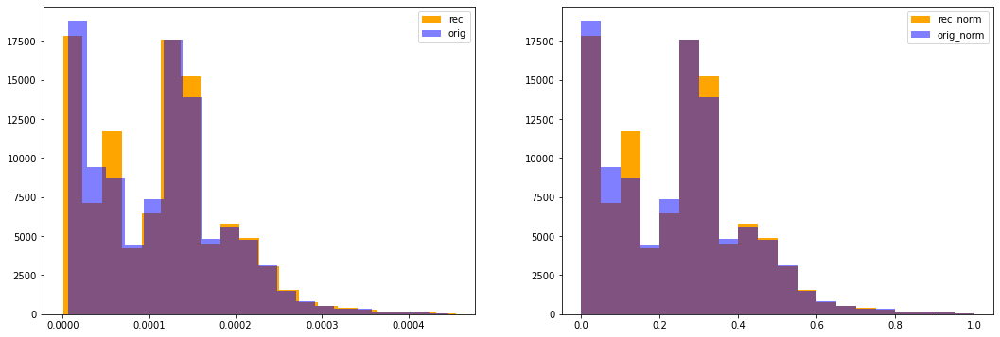

In [38]:
fig = plt.figure(figsize=(18,6))
ax = fig.add_subplot(121)
ax.hist(rec.ravel(),bins=20,color="orange",label="rec")
ax.hist(orig.ravel(),bins=20,alpha=0.5,color="blue",label="orig")
ax.legend()
ax = fig.add_subplot(122)
ax.hist(im2.ravel(),bins=20,color="orange",label="rec_norm")
ax.hist(im1.ravel(),bins=20,alpha=0.5,color="blue",label="orig_norm")
ax.legend()
plt.show()

stack ssim: 0.8569313543225601
slice-average-based: 0.8683868864481639
% 0.0
averge scores so far:
VIF: 0.9382205489810888 MS-SSIM: 0.9674204 SSIM: 0.8683868864481639 PSNR: 33.83121601940373 



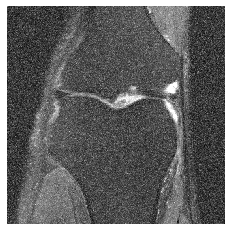

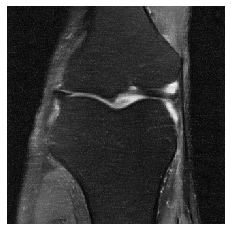

In [96]:
SSIMs = []
PSNRs = []
MS_SSIMs = []
VIFs = []
S = []
P = []
SS = []

#files = glob.glob("/hdd/multicoil_val/*")
#random.shuffle(files)

#files = pd.copy()
#wfats = ["file1000000.h5","file1000325.h5","file1000555.h5","file1000026.h5"]
#wofats = ["file1001585.h5","file1000033.h5","file1000885.h5","file1001977.h5"]
#files = wfats + wofats
#random.shuffle(files)

for i,filename in enumerate(files[80:100]):
    ##### load #####
    #filename = "/hdd/multicoil_val/" + filename
    f = h5py.File(filename, 'r') # contains a kspace measurement f['kspace'] and rss reconstruction f['reconstruction_rss']
    
    # which slice to consider in the following
    slicenu1 = f["kspace"].shape[0]//2
    
    st = []
    outputs = []
    targets = [] 
    
    for slicenu in range(f["kspace"].shape[0]):
        if slicenu != slicenu1:
            continue
        slice_ksp = f['kspace'][slicenu]
        slice_ksp_torchtensor = transform.to_tensor(slice_ksp)      # Convert from numpy array to pytorch tensor

        ##### create a random mask #####
        try: # if the file already comes with a mask
            temp = np.array([1 if e else 0 for e in f["mask"]])
            temp = temp[np.newaxis].T
            temp = np.array([[temp]])
            mask = transform.to_tensor(temp).type(dtype).detach().cpu()
        except: # if we need to create a mask
            desired_factor = 4
            undersampling_factor = 0
            tolerance = 0.03
            while undersampling_factor < desired_factor - tolerance or undersampling_factor > desired_factor + tolerance:
                mask_func = MaskFunc(center_fractions=[0.07], accelerations=[desired_factor])  # Create the mask function object
                masked_kspace, mask = transform.apply_mask(slice_ksp_torchtensor, mask_func=mask_func)   # Apply the mask to k-space
                mask1d = var_to_np(mask)[0,:,0]
                undersampling_factor = len(mask1d) / sum(mask1d)

        mask1d = var_to_np(mask)[0,:,0]

        # The provided mask and data have last dim of 368, but the actual data is smaller.
        # To prevent forcing the network to learn outside the data region, we force the mask to 0 there.
        #mask1d[:mask1d.shape[-1]//2-160] = 0 
        #mask1d[mask1d.shape[-1]//2+160:] =0
        mask2d = np.repeat(mask1d[None,:], slice_ksp.shape[1], axis=0).astype(int) # Turning 1D Mask into 2D that matches data dimensions
        mask2d = np.pad(mask2d,((0,),((slice_ksp.shape[-1]-mask2d.shape[-1])//2,)),mode='constant') # Zero padding to make sure dimensions match up
        mask = transform.to_tensor( np.array( [[mask2d[0][np.newaxis].T]] ) ).type(dtype).detach().cpu()

        #f.close()

        ##### sample the k-space #####
        masked_kspace, mask = transform.apply_mask(slice_ksp_torchtensor, mask = mask)
        unders_measurement = np_to_var( masked_kspace.data.cpu().numpy() ).type(dtype)

        ##### prepare the input for UNET #####
        image = transforms.ifft2(masked_kspace)
        # Crop input image to given resolution if larger
        smallest_width = min(320, image.shape[-2])
        smallest_height = min(320, image.shape[-3])

        crop_size = (smallest_height, smallest_width)
        image = transforms.complex_center_crop(image, crop_size)
        # Absolute value
        image = transforms.complex_abs(image)
        # Apply Root-Sum-of-Squares if multicoil data
        image = transforms.root_sum_of_squares(image)
        # Normalize input
        image, mean, std = transforms.normalize_instance(image, eps=1e-11)
        image = image.clamp(-6, 6)

        ### normalize target
        orig = f["reconstruction_rss"][slicenu]
        orig = transforms.to_tensor(orig)
        orig = transforms.center_crop(orig, (320,320))
        orig = transforms.normalize(orig, mean, std, eps=1e-11)
        #orig = torch.from_numpy(orig)
        orig = orig.clamp(-6, 6)
        orig = orig.data.cpu().numpy()
        
        ##### get the UNET output #####
        out = umdl( torch.from_numpy(np.array([image.data.cpu().numpy()])).type(dtype) )
        out_np = out.data.cpu().numpy()[0]
        
        ##### balance the dynamic range for score computation #####
        mean = mean.data.cpu().numpy()[np.newaxis][0]
        std = std.data.cpu().numpy()[np.newaxis][0]
        ##### scores ######
        im1 = orig*std+mean
        im2 = out_np*std+mean
        
        targets.append(im1)
        outputs.append(im2)
        
        #im1 = (im1-im1.min()) / (im1.max()-im1.min())
        #im2 = (im2-im2.min()) / (im2.max()-im2.min())
        #im1 = np.floor(im1*255)
        #im2 = np.floor(im2*255)
        
        #im1 = (im1-im1.mean()) / (im1.std())
        #im2 = (im2-im2.mean()) / (im2.std())
        #M = max(abs(im1.min()),abs(im2.min()))
        #im1 += M
        #im2 += M
        
        #im2 = hist_match(im2,im1)
        
        ssim_const = ssim(np.array([im1]),np.array([im2]))
        psnr_const = psnr(np.array([im1]),np.array([im2]))
        s_dtype = torch.FloatTensor
        ms_ssim_const = ms_ssim(torch.tensor([[im1]]).type(s_dtype), torch.tensor([[im2]]).type(s_dtype), data_range=im1.max())
        #im1 = (im1-im1.min())/(im1.max()-im1.min())
        #im2 = (im2-im2.min())/(im2.max()-im2.min())
        vif_const = vifp_mscale(im1*255, im2*255, 1, 1e-10)
        
        if psnr_const < 26:
            plt.imshow(im1,"gray")
            plt.axis("off")
            plt.savefig('orig.eps', dpi=50, format='eps',bbox_inches="tight",pad_inches=0)
            plt.show()
            plt.imshow(im2,"gray")
            plt.axis("off")
            plt.savefig('rec.eps', dpi=50, format='eps',bbox_inches="tight",pad_inches=0)
            plt.show()
            
        SSIMs.append(ssim_const)
        PSNRs.append(psnr_const)
        MS_SSIMs.append(ms_ssim_const)
        VIFs.append(vif_const)
        st.append(ssim_const)
    SS.append(np.mean(st))
    
    outputs_ = np.stack(outputs)
    targets_ = np.stack(targets)
    outputs_ = (outputs_-outputs_.min()) / (outputs_.max()-outputs_.min())
    targets_ = (targets_-targets_.min()) / (targets_.max()-targets_.min())
    #outputs_ = np.floor(outputs_*256)
    #targets_ = np.floor(targets_*256)
    #outputs_ = (outputs_-outputs_.mean()) / (outputs_.std())
    #targets_ = (targets_-targets_.mean()) / (targets_.std())
    #M = max( abs(outputs_.min()),abs(targets_.min()) )
    #outputs_ += M
    #targets_ += M
    
    #outputs_ = hist_match(outputs_,targets_)
    ##### scores ######
    ssim_const = ssim(targets_,outputs_)
    psnr_const = psnr(targets_,outputs_)
    S.append(ssim_const)
    P.append(psnr_const)
    if i % 20 == 0:
        print("stack ssim:",np.mean(S))
        print("slice-average-based:",np.mean(SS))
    if i % 20 == 0:
        print("%",100*i/len(files))
        print("averge scores so far:")
        print("VIF:",np.mean(VIFs),"MS-SSIM:",np.mean(MS_SSIMs),"SSIM:",np.mean(SSIMs),"PSNR:",np.mean(PSNRs),"\n")

stack ssim: 0.7151611225439906
slice-average-based: 0.7151611225439906
% 0.0
averge scores so far:
VIF: 0.25835284720184537 MS-SSIM: 0.9227176 SSIM: 0.7151611225439906 PSNR: 25.634994284789734 

stack ssim: 0.7156455615920281
slice-average-based: 0.7156455615920281
% 10.050251256281408
averge scores so far:
VIF: 0.28776064109635646 MS-SSIM: 0.9234179 SSIM: 0.7156455615920281 PSNR: 27.240546304287292 



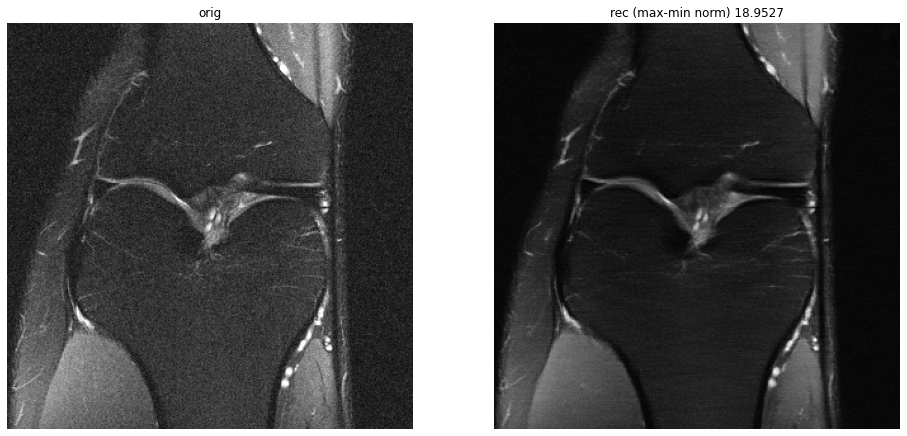

stack ssim: 0.7249103648295689
slice-average-based: 0.7249103648295689
% 20.100502512562816
averge scores so far:
VIF: 0.3035418774885898 MS-SSIM: 0.92369694 SSIM: 0.7249103648295689 PSNR: 27.63662812033611 



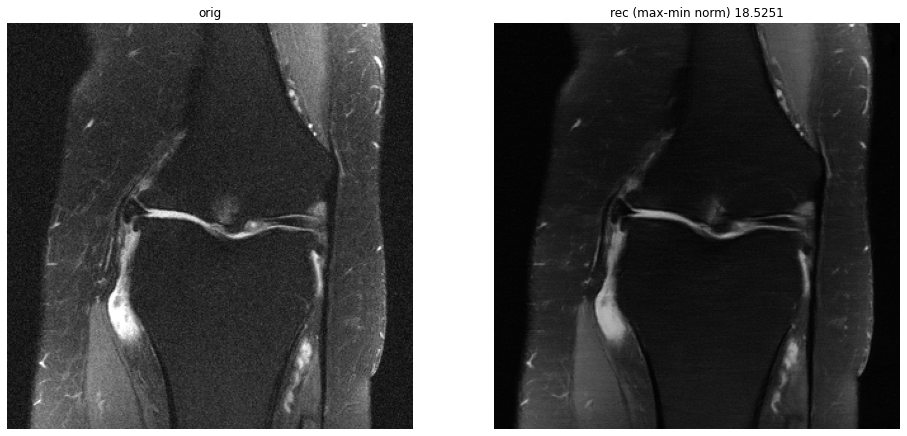

stack ssim: 0.718921080256105
slice-average-based: 0.718921080256105
% 30.150753768844222
averge scores so far:
VIF: 0.29752691957617217 MS-SSIM: 0.921304 SSIM: 0.718921080256105 PSNR: 27.338564408792276 



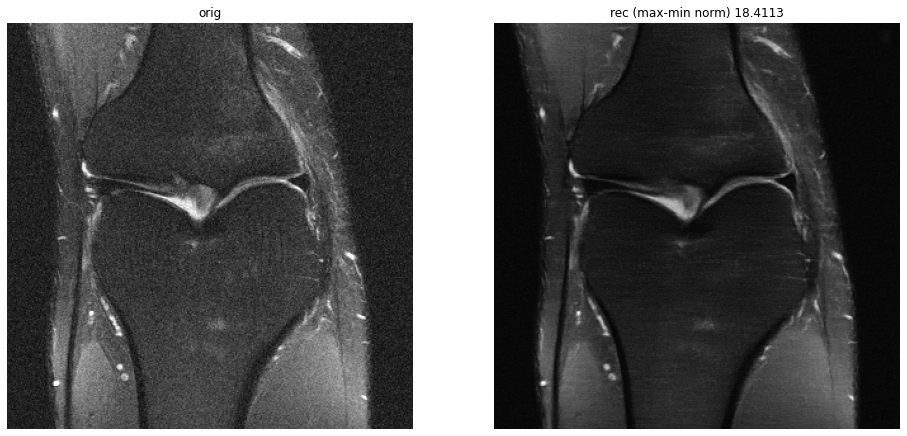

stack ssim: 0.7208572353548613
slice-average-based: 0.7208572353548613
% 40.20100502512563
averge scores so far:
VIF: 0.29828012887319466 MS-SSIM: 0.92045224 SSIM: 0.7208572353548613 PSNR: 27.542034969829174 

stack ssim: 0.7281241724638831
slice-average-based: 0.7281241724638831
% 50.25125628140704
averge scores so far:
VIF: 0.30378896691471996 MS-SSIM: 0.9223546 SSIM: 0.7281241724638831 PSNR: 27.873206042911093 



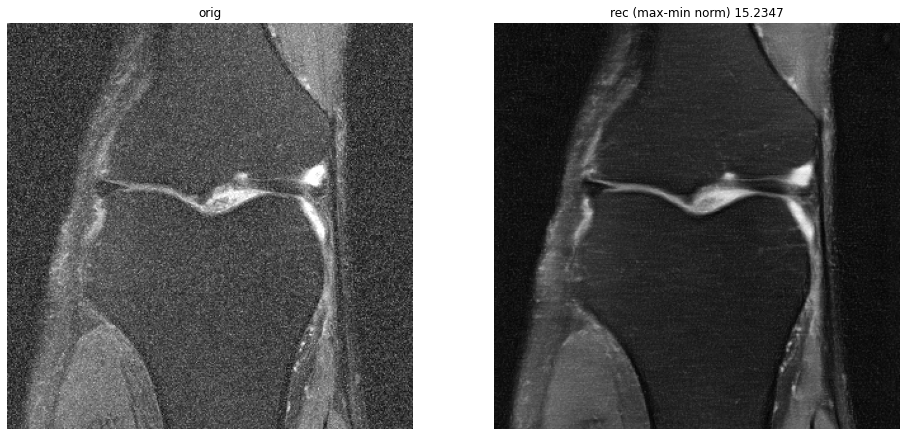

stack ssim: 0.7231598814263427
slice-average-based: 0.7231598814263427
% 60.301507537688444
averge scores so far:
VIF: 0.3019127275282693 MS-SSIM: 0.92061317 SSIM: 0.7231598814263427 PSNR: 27.680555240153726 

stack ssim: 0.7297207407468637
slice-average-based: 0.7297207407468637
% 70.35175879396985
averge scores so far:
VIF: 0.30380577588422636 MS-SSIM: 0.92280406 SSIM: 0.7297207407468637 PSNR: 27.846043870808426 

stack ssim: 0.7385994077775727
slice-average-based: 0.7385994077775727
% 80.40201005025126
averge scores so far:
VIF: 0.3099540169152148 MS-SSIM: 0.92594784 SSIM: 0.7385994077775727 PSNR: 28.034563511678723 



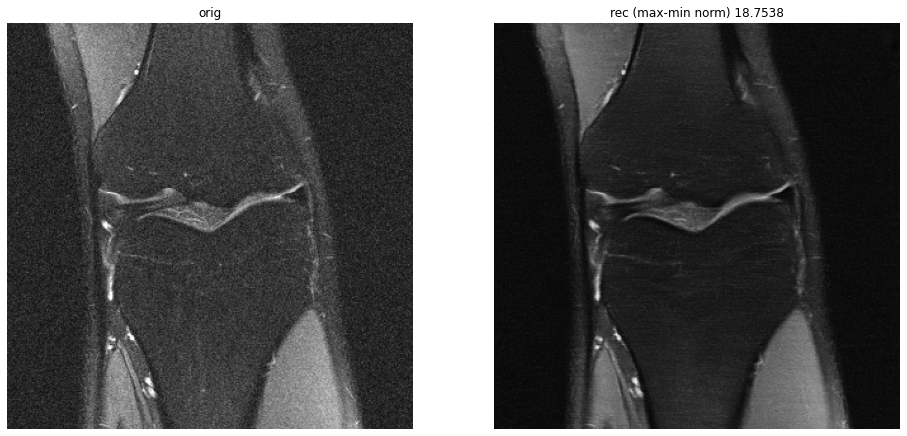

stack ssim: 0.7321962300053733
slice-average-based: 0.7321962300053733
% 90.45226130653266
averge scores so far:
VIF: 0.30626281163928454 MS-SSIM: 0.92393124 SSIM: 0.7321962300053733 PSNR: 27.953186749411056 



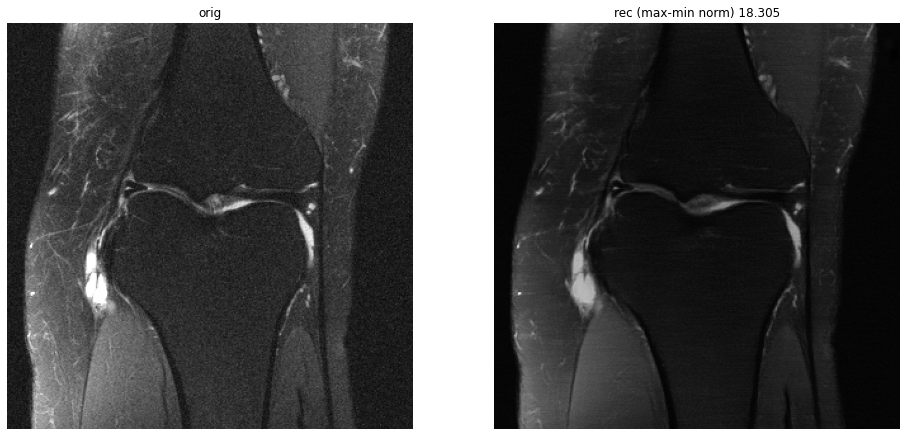

In [9]:
SSIMs = []
PSNRs = []
MS_SSIMs = []
VIFs = []
S = []
P = []
SS = []

files = glob.glob("/hdd/multicoil_val/*")
#random.shuffle(files)

#wfats = ["file1000000.h5","file1000325.h5","file1000555.h5","file1000026.h5"]
#wofats = ["file1001585.h5","file1000033.h5","file1000885.h5","file1001977.h5"]
#files = wfats + wofats
#random.shuffle(files)

for i,filename in enumerate(files):
    ##### load #####
    #filename = "/hdd/multicoil_val/" + filename
    f = h5py.File(filename, 'r') # contains a kspace measurement f['kspace'] and rss reconstruction f['reconstruction_rss']
    
    # which slice to consider in the following
    slicenu1 = f["kspace"].shape[0]//2
    
    st = []
    outputs = []
    targets = [] 
    
    for slicenu in range(f["kspace"].shape[0]):
        if slicenu != slicenu1:
            continue
        slice_ksp = f['kspace'][slicenu]
        slice_ksp_torchtensor = transform.to_tensor(slice_ksp)      # Convert from numpy array to pytorch tensor

        ##### create a random mask #####
        try: # if the file already comes with a mask
            temp = np.array([1 if e else 0 for e in f["mask"]])
            temp = temp[np.newaxis].T
            temp = np.array([[temp]])
            mask = transform.to_tensor(temp).type(dtype).detach().cpu()
        except: # if we need to create a mask
            desired_factor = 4
            undersampling_factor = 0
            tolerance = 0.03
            while undersampling_factor < desired_factor - tolerance or undersampling_factor > desired_factor + tolerance:
                mask_func = MaskFunc(center_fractions=[0.07], accelerations=[desired_factor])  # Create the mask function object
                masked_kspace, mask = transform.apply_mask(slice_ksp_torchtensor, mask_func=mask_func)   # Apply the mask to k-space
                mask1d = var_to_np(mask)[0,:,0]
                undersampling_factor = len(mask1d) / sum(mask1d)

        mask1d = var_to_np(mask)[0,:,0]

        # The provided mask and data have last dim of 368, but the actual data is smaller.
        # To prevent forcing the network to learn outside the data region, we force the mask to 0 there.
        #mask1d[:mask1d.shape[-1]//2-160] = 0 
        #mask1d[mask1d.shape[-1]//2+160:] =0
        mask2d = np.repeat(mask1d[None,:], slice_ksp.shape[1], axis=0).astype(int) # Turning 1D Mask into 2D that matches data dimensions
        mask2d = np.pad(mask2d,((0,),((slice_ksp.shape[-1]-mask2d.shape[-1])//2,)),mode='constant') # Zero padding to make sure dimensions match up
        mask = transform.to_tensor( np.array( [[mask2d[0][np.newaxis].T]] ) ).type(dtype).detach().cpu()

        #f.close()

        ##### sample the k-space #####
        masked_kspace, mask = transform.apply_mask(slice_ksp_torchtensor, mask = mask)
        unders_measurement = np_to_var( masked_kspace.data.cpu().numpy() ).type(dtype)

        ##### prepare the input for UNET #####
        image = transforms.ifft2(masked_kspace)
        # Crop input image to given resolution if larger
        smallest_width = min(320, image.shape[-2])
        smallest_height = min(320, image.shape[-3])

        crop_size = (smallest_height, smallest_width)
        image = transforms.complex_center_crop(image, crop_size)
        # Absolute value
        image = transforms.complex_abs(image)
        # Apply Root-Sum-of-Squares if multicoil data
        image = transforms.root_sum_of_squares(image)
        # Normalize input
        image, mean, std = transforms.normalize_instance(image, eps=1e-11)
        image = image.clamp(-6, 6)

        ### normalize target
        orig = f["reconstruction_rss"][slicenu]
        orig = transforms.to_tensor(orig)
        orig = transforms.center_crop(orig, (320,320))
        orig = transforms.normalize(orig, mean, std, eps=1e-11)
        #orig = torch.from_numpy(orig)
        orig = orig.clamp(-6, 6)
        orig = orig.data.cpu().numpy()
        
        ##### get the UNET output #####
        out = umdl( torch.from_numpy(np.array([image.data.cpu().numpy()])).type(dtype) )
        out_np = out.data.cpu().numpy()[0]
        
        ##### balance the dynamic range for score computation #####
        mean = mean.data.cpu().numpy()[np.newaxis][0]
        std = std.data.cpu().numpy()[np.newaxis][0]
        ##### scores ######
        im1 = orig*std+mean
        im2 = out_np*std+mean
        
        targets.append(im1)
        outputs.append(im2)
        
        im1 = (im1-im1.min()) / (im1.max()-im1.min())
        im2 = (im2-im2.min()) / (im2.max()-im2.min())
        #im1 = np.floor(im1*255)
        #im2 = np.floor(im2*255)
        
        #im1 = (im1-im1.mean()) / (im1.std())
        #im2 = (im2-im2.mean()) / (im2.std())
        #M = max(abs(im1.min()),abs(im2.min()))
        #im1 += M
        #im2 += M
        
        #im2 = hist_match(im2,im1)
        
        ssim_const = ssim(np.array([im1]),np.array([im2]))
        psnr_const = psnr(np.array([im1]),np.array([im2]))
        s_dtype = torch.FloatTensor
        ms_ssim_const = ms_ssim(torch.tensor([[im1]]).type(s_dtype), torch.tensor([[im2]]).type(s_dtype), data_range=im1.max())
        #im1 = (im1-im1.min())/(im1.max()-im1.min())
        #im2 = (im2-im2.min())/(im2.max()-im2.min())
        vif_const = vifp_mscale(im1*255, im2*255, 1, 1e-10)
        
        if psnr_const < 19:
            fig = plt.figure(figsize=(16,12))
            ax = fig.add_subplot(121)
            ax.imshow(im1,"gray")
            ax.set_title("orig")
            ax.axis("off")
            ax = fig.add_subplot(122)
            ax.imshow(im2,"gray")
            ax.set_title("rec (max-min norm) {}".format(round(psnr_const,4)))
            ax.axis("off")
            plt.show()
        
        SSIMs.append(ssim_const)
        PSNRs.append(psnr_const)
        MS_SSIMs.append(ms_ssim_const)
        VIFs.append(vif_const)
        st.append(ssim_const)
    SS.append(np.mean(st))
    
    outputs_ = np.stack(outputs)
    targets_ = np.stack(targets)
    outputs_ = (outputs_-outputs_.min()) / (outputs_.max()-outputs_.min())
    targets_ = (targets_-targets_.min()) / (targets_.max()-targets_.min())
    #outputs_ = np.floor(outputs_*256)
    #targets_ = np.floor(targets_*256)
    #outputs_ = (outputs_-outputs_.mean()) / (outputs_.std())
    #targets_ = (targets_-targets_.mean()) / (targets_.std())
    #M = max( abs(outputs_.min()),abs(targets_.min()) )
    #outputs_ += M
    #targets_ += M
    
    #outputs_ = hist_match(outputs_,targets_)
    ##### scores ######
    ssim_const = ssim(targets_,outputs_)
    psnr_const = psnr(targets_,outputs_)
    S.append(ssim_const)
    P.append(psnr_const)
    if i % 20 == 0:
        print("stack ssim:",np.mean(S))
        print("slice-average-based:",np.mean(SS))
    if i % 20 == 0:
        print("%",100*i/len(files))
        print("averge scores so far:")
        print("VIF:",np.mean(VIFs),"MS-SSIM:",np.mean(MS_SSIMs),"SSIM:",np.mean(SSIMs),"PSNR:",np.mean(PSNRs),"\n")

In [105]:
SSIMs = []
PSNRs = []
MS_SSIMs = []
VIFs = []
S = []
P = []
SS = []

files = glob.glob("/hdd/multicoil_val/*")
#files = glob.glob("/hdd/brain/*")
#random.shuffle(files)

#files = pd.copy()

wfats = ["file1000000.h5","file1000325.h5","file1000555.h5","file1000026.h5"]
wofats = ["file1001585.h5","file1000033.h5","file1000885.h5","file1001977.h5"]
#files = wfats + wofats
#random.shuffle(files)

for i,filename in enumerate(files):
    ##### load #####
    #filename = "/hdd/multicoil_val/" + filename
    f = h5py.File(filename, 'r') # contains a kspace measurement f['kspace'] and rss reconstruction f['reconstruction_rss']
    
    # which slice to consider in the following
    slicenu1 = f["kspace"].shape[0]//2
    
    st = []
    outputs = []
    targets = [] 
    
    for slicenu in range(f["kspace"].shape[0]):
        if slicenu != slicenu1:
            continue
        slice_ksp = f['kspace'][slicenu]
        slice_ksp_torchtensor = transform.to_tensor(slice_ksp)      # Convert from numpy array to pytorch tensor

        ##### create a random mask #####
        try: # if the file already comes with a mask
            temp = np.array([1 if e else 0 for e in f["mask"]])
            temp = temp[np.newaxis].T
            temp = np.array([[temp]])
            mask = transform.to_tensor(temp).type(dtype).detach().cpu()
        except: # if we need to create a mask
            desired_factor = 4
            undersampling_factor = 0
            tolerance = 0.03
            while undersampling_factor < desired_factor - tolerance or undersampling_factor > desired_factor + tolerance:
                mask_func = MaskFunc(center_fractions=[0.07], accelerations=[desired_factor])  # Create the mask function object
                masked_kspace, mask = transform.apply_mask(slice_ksp_torchtensor, mask_func=mask_func)   # Apply the mask to k-space
                mask1d = var_to_np(mask)[0,:,0]
                undersampling_factor = len(mask1d) / sum(mask1d)

        mask1d = var_to_np(mask)[0,:,0]

        # The provided mask and data have last dim of 368, but the actual data is smaller.
        # To prevent forcing the network to learn outside the data region, we force the mask to 0 there.
        #mask1d[:mask1d.shape[-1]//2-160] = 0 
        #mask1d[mask1d.shape[-1]//2+160:] =0
        mask2d = np.repeat(mask1d[None,:], slice_ksp.shape[1], axis=0).astype(int) # Turning 1D Mask into 2D that matches data dimensions
        mask2d = np.pad(mask2d,((0,),((slice_ksp.shape[-1]-mask2d.shape[-1])//2,)),mode='constant') # Zero padding to make sure dimensions match up
        mask = transform.to_tensor( np.array( [[mask2d[0][np.newaxis].T]] ) ).type(dtype).detach().cpu()

        #f.close()

        ##### sample the k-space #####
        masked_kspace, mask = transform.apply_mask(slice_ksp_torchtensor, mask = mask)
        unders_measurement = np_to_var( masked_kspace.data.cpu().numpy() ).type(dtype)

        ##### prepare the input for UNET #####
        image = transforms.ifft2(masked_kspace)
        # Crop input image to given resolution if larger
        smallest_width = min(320, image.shape[-2])
        smallest_height = min(320, image.shape[-3])

        crop_size = (smallest_height, smallest_width)
        image = transforms.complex_center_crop(image, crop_size)
        # Absolute value
        image = transforms.complex_abs(image)
        # Apply Root-Sum-of-Squares if multicoil data
        image = transforms.root_sum_of_squares(image)
        # Normalize input
        image, mean, std = transforms.normalize_instance(image, eps=1e-11)
        image = image.clamp(-6, 6)

        ### normalize target
        orig = f["reconstruction_rss"][slicenu]
        orig = transforms.to_tensor(orig)
        orig = transforms.center_crop(orig, (320,320))
        orig = transforms.normalize(orig, mean, std, eps=1e-11)
        #orig = torch.from_numpy(orig)
        orig = orig.clamp(-6, 6)
        orig = orig.data.cpu().numpy()
        
        ##### get the UNET output #####
        out = umdl( torch.from_numpy(np.array([image.data.cpu().numpy()])).type(dtype) )
        out_np = out.data.cpu().numpy()[0]
        
        ##### balance the dynamic range for score computation #####
        mean = mean.data.cpu().numpy()[np.newaxis][0]
        std = std.data.cpu().numpy()[np.newaxis][0]
        ##### scores ######
        im1 = orig*std+mean
        im2 = out_np*std+mean
        
        targets.append(im1)
        outputs.append(im2)
        
        #im1 = (im1-im1.min()) / (im1.max()-im1.min())
        #im2 = (im2-im2.min()) / (im2.max()-im2.min())
        #im1 = np.floor(im1*255)
        #im2 = np.floor(im2*255)
        
        im1 = (im1-im1.mean()) / (im1.std())
        im1 *= im2.std()
        im1 += im2.mean()
        #im2 = (im2-im2.mean()) / (im2.std())
        #M = max(abs(im1.min()),abs(im2.min()))
        #im1 += M
        #im2 += M
        
        #im2 = hist_match(im2,im1)
        
        ssim_const = ssim(np.array([im1]),np.array([im2]))
        psnr_const = psnr(np.array([im1]),np.array([im2]))
        s_dtype = torch.FloatTensor
        ms_ssim_const = ms_ssim(torch.tensor([[im1]]).type(s_dtype), torch.tensor([[im2]]).type(s_dtype), data_range=im1.max())
        #im1 = (im1-im1.min())/(im1.max()-im1.min())
        #im2 = (im2-im2.min())/(im2.max()-im2.min())
        vif_const = vifp_mscale(im1, im2, im1.mean(), 1e-10)
        
        if psnr_const < 2:
            fig = plt.figure(figsize=(16,12))
            ax = fig.add_subplot(121)
            ax.imshow(im1,"gray")
            ax.set_title("orig")
            ax.axis("off")
            ax = fig.add_subplot(122)
            ax.imshow(im2,"gray")
            ax.set_title("orig {}".format(round(psnr_const,4)))
            ax.axis("off")
            plt.show()
        
        SSIMs.append(ssim_const)
        PSNRs.append(psnr_const)
        MS_SSIMs.append(ms_ssim_const)
        VIFs.append(vif_const)
        st.append(ssim_const)
    SS.append(np.mean(st))
    
    outputs_ = np.stack(outputs)
    targets_ = np.stack(targets)
    #outputs_ = (outputs_-outputs_.min()) / (outputs_.max()-outputs_.min())
    #targets_ = (targets_-targets_.min()) / (targets_.max()-targets_.min())
    
    #outputs_ = np.floor(outputs_*256)
    #targets_ = np.floor(targets_*256)
    #outputs_ = (outputs_-outputs_.mean()) / (outputs_.std())
    targets_ = (targets_-targets_.mean()) / (targets_.std())
    targets_ *= outputs_.std()
    targets_ += outputs_.mean()
    #M = max( abs(outputs_.min()),abs(targets_.min()) )
    #outputs_ += M
    #targets_ += M
    
    #outputs_ = hist_match(outputs_,targets_)
    ##### scores ######
    ssim_const = ssim(targets_,outputs_)
    psnr_const = psnr(targets_,outputs_)
    S.append(ssim_const)
    P.append(psnr_const)
    if i % 10 == 0:
        print("stack ssim:",np.mean(S))
        print("slice-average-based:",np.mean(SS))
    if i % 10 == 0:
        print("%",100*i/len(files))
        print("averge scores so far:")
        print("VIF:",np.mean(VIFs),"MS-SSIM:",np.mean(MS_SSIMs),"SSIM:",np.mean(SSIMs),"PSNR:",np.mean(PSNRs),"\n")

stack ssim: 0.7915729968403148
slice-average-based: 0.7915729968403148
% 0.0
averge scores so far:
VIF: 0.46873400004499227 MS-SSIM: 0.95420873 SSIM: 0.7915729968403148 PSNR: 32.03876812648509 

stack ssim: 0.7863075773894632
slice-average-based: 0.7863075773894632
% 5.025125628140704
averge scores so far:
VIF: 0.5769229176428154 MS-SSIM: 0.94826066 SSIM: 0.7863075773894632 PSNR: 31.60605641949603 

stack ssim: 0.7770373128521787
slice-average-based: 0.7770373128521787
% 10.050251256281408
averge scores so far:
VIF: 0.567049846822219 MS-SSIM: 0.94796705 SSIM: 0.7770373128521787 PSNR: 31.56345934585917 

stack ssim: 0.7839015644132421
slice-average-based: 0.7839015644132421
% 15.075376884422111
averge scores so far:
VIF: 0.5801129787916572 MS-SSIM: 0.9494561 SSIM: 0.7839015644132421 PSNR: 31.869148488410808 

stack ssim: 0.7840447310260411
slice-average-based: 0.7840447310260411
% 20.100502512562816
averge scores so far:
VIF: 0.58994607368117 MS-SSIM: 0.9495095 SSIM: 0.7840447310260411 

### brain

In [10]:
print("VIF:",np.mean(VIFs),"(avg)",max(VIFs),"(max)",min(VIFs),"(min)")
print("MS-SSIM:",np.mean(MS_SSIMs),"(avg)",max(MS_SSIMs),"(max)",min(MS_SSIMs),"(min)")
print("SSIM:",np.mean(SSIMs),"(avg)",max(SSIMs),"(max)",min(SSIMs),"(min)")
print("PSNR:",np.mean(PSNRs),"(avg)",max(PSNRs),"(max)",min(PSNRs),"(min)")

VIF: 0.6851334155979873 (avg) 0.7347583680323662 (max) 0.6241669175103415 (min)
MS-SSIM: 0.9507295 (avg) tensor(0.9633) (max) tensor(0.9232) (min)
SSIM: 0.8540170105159994 (avg) 0.8888922828642265 (max) 0.8022451527388288 (min)
PSNR: 30.938615539072998 (avg) 33.454101720079024 (max) 27.999548929265256 (min)


In [13]:
SSIMs,PSNRs

([0.8416852657433064,
  0.8022451527388288,
  0.8534207696318418,
  0.883841581601794,
  0.8888922828642265],
 [30.308071230029014,
  27.999548929265256,
  29.83802121958447,
  33.093334596407246,
  33.454101720079024])

In [14]:
files

['/hdd/brain/file_brain_AXFLAIR_200_6002499.h5',
 '/hdd/brain/file_brain_AXFLAIR_200_6002462.h5',
 '/hdd/brain/file_brain_AXFLAIR_200_6002471.h5',
 '/hdd/brain/file_brain_AXFLAIR_200_6002483.h5',
 '/hdd/brain/file_brain_AXFLAIR_200_6002477.h5']

### ###

In [13]:
len(SS)

199

In [106]:
print("VIF:",np.mean(VIFs),"(avg)",max(VIFs),"(max)",min(VIFs),"(min)")
print("MS-SSIM:",np.mean(MS_SSIMs),"(avg)",max(MS_SSIMs),"(max)",min(MS_SSIMs),"(min)")
print("SSIM:",np.mean(SSIMs),"(avg)",max(SSIMs),"(max)",min(SSIMs),"(min)")
print("PSNR:",np.mean(PSNRs),"(avg)",max(PSNRs),"(max)",min(PSNRs),"(min)")

VIF: 0.5954581346437818 (avg) 0.8963563863343519 (max) 0.14630396588277705 (min)
MS-SSIM: 0.9488599 (avg) tensor(0.9840) (max) tensor(0.6886) (min)
SSIM: 0.7882632985748271 (avg) 0.9432164389732718 (max) 0.2794209885521502 (min)
PSNR: 32.035682037596736 (avg) 39.16395724749139 (max) 22.100369551242384 (min)


In [9]:
print("VIF:",np.mean(VIFs),"(avg)",max(VIFs),"(max)",min(VIFs),"(min)")
print("MS-SSIM:",np.mean(MS_SSIMs),"(avg)",max(MS_SSIMs),"(max)",min(MS_SSIMs),"(min)")
print("SSIM:",np.mean(SSIMs),"(avg)",max(SSIMs),"(max)",min(SSIMs),"(min)")
print("PSNR:",np.mean(PSNRs),"(avg)",max(PSNRs),"(max)",min(PSNRs),"(min)")

VIF: 0.7925842628032221 (avg) 0.9677241707920305 (max) 0.1397097978768036 (min)
MS-SSIM: 0.9484215 (avg) tensor(0.9841) (max) tensor(0.6746) (min)
SSIM: 0.7883119069474974 (avg) 0.9454977882938341 (max) 0.28123754215958907 (min)
PSNR: 32.04123913648838 (avg) 39.345596600531685 (max) 22.11249696604273 (min)


### volume-based

In [11]:
np.mean(S),np.mean(SS),np.mean(P)

(0.8357069183362542, 0.7564800336419066, 34.32188081722485)

In [12]:
print("VIF:",np.mean(VIFs),"(avg)",max(VIFs),"(max)",min(VIFs),"(min)")
print("MS-SSIM:",np.mean(MS_SSIMs),"(avg)",max(MS_SSIMs),"(max)",min(MS_SSIMs),"(min)")
print("SSIM:",np.mean(SSIMs),"(avg)",max(SSIMs),"(max)",min(SSIMs),"(min)")
print("PSNR:",np.mean(PSNRs),"(avg)",max(PSNRs),"(max)",min(PSNRs),"(min)")

VIF: 0.7164327928430207 (avg) 0.9453348083683973 (max) 0.0 (min)
MS-SSIM: 0.9353427 (avg) tensor(0.9916) (max) tensor(0.4338) (min)
SSIM: 0.7590783945273348 (avg) 0.954124077660456 (max) 0.21694482782267546 (min)
PSNR: 31.400387057275267 (avg) 38.001185827788994 (max) 17.56458867814374 (min)


In [9]:
P,S,files

([36.49740459281429,
  31.012280026916187,
  31.564445752021232,
  31.082323472439345,
  37.2692387998998,
  36.88940804266,
  35.39353106013802,
  34.77948693945965],
 [0.8848497202167898,
  0.7151439346846084,
  0.7205919884164957,
  0.7072343176918982,
  0.9404949415555379,
  0.9319157327605145,
  0.8966970765632641,
  0.8900611761359163],
 ['file1000000.h5',
  'file1000325.h5',
  'file1000555.h5',
  'file1000026.h5',
  'file1001585.h5',
  'file1000033.h5',
  'file1000885.h5',
  'file1001977.h5'])

In [10]:
np.mean(S),np.mean(SS),np.mean(P)

(0.8358736110031281, 0.764322037656292, 34.311014835793564)

In [11]:
print("VIF:",np.mean(VIFs),"(avg)",max(VIFs),"(max)",min(VIFs),"(min)")
print("MS-SSIM:",np.mean(MS_SSIMs),"(avg)",max(MS_SSIMs),"(max)",min(MS_SSIMs),"(min)")
print("SSIM:",np.mean(SSIMs),"(avg)",max(SSIMs),"(max)",min(SSIMs),"(min)")
print("PSNR:",np.mean(PSNRs),"(avg)",max(PSNRs),"(max)",min(PSNRs),"(min)")

VIF: nan (avg) 0.9714287368727912 (max) 0.10997537749675936 (min)
MS-SSIM: 0.94201136 (avg) tensor(0.9908) (max) tensor(0.7438) (min)
SSIM: 0.7665099123124279 (avg) 0.9504184263582106 (max) 0.33437682432221694 (min)
PSNR: 31.625187428912778 (avg) 38.06595274004152 (max) 23.927942252896145 (min)


### without normalization

In [68]:
np.mean(S),np.mean(SS),np.mean(P)

(0.8690353563998409, 0.8690353563998409, 33.828462921310795)

In [69]:
print("VIF:",np.mean(VIFs),"(avg)",max(VIFs),"(max)",min(VIFs),"(min)")
print("MS-SSIM:",np.mean(MS_SSIMs),"(avg)",max(MS_SSIMs),"(max)",min(MS_SSIMs),"(min)")
print("SSIM:",np.mean(SSIMs),"(avg)",max(SSIMs),"(max)",min(SSIMs),"(min)")
print("PSNR:",np.mean(PSNRs),"(avg)",max(PSNRs),"(max)",min(PSNRs),"(min)")

VIF: 0.8833942472084461 (avg) 0.9752707840113307 (max) 0.7587220042785738 (min)
MS-SSIM: 0.96762496 (avg) tensor(0.9843) (max) tensor(0.9536) (min)
SSIM: 0.8690353563998409 (avg) 0.9450812563641816 (max) 0.8189953725441976 (min)
PSNR: 33.828462921310795 (avg) 39.29521527740124 (max) 31.669371099397186 (min)


### with normalization

In [90]:
np.mean(S),np.mean(P),np.min(P),np.max(P)

(0.8622671743476614, 33.22657988014025, 25.61978223374057, 38.468086206197015)

In [91]:
print("VIF:",np.mean(VIFs),"(avg)",max(VIFs),"(max)",min(VIFs),"(min)")
print("MS-SSIM:",np.mean(MS_SSIMs),"(avg)",max(MS_SSIMs),"(max)",min(MS_SSIMs),"(min)")
print("SSIM:",np.mean(SSIMs),"(avg)",max(SSIMs),"(max)",min(SSIMs),"(min)")
print("PSNR:",np.mean(PSNRs),"(avg)",max(PSNRs),"(max)",min(PSNRs),"(min)")

VIF: 0.35655151791235296 (avg) 0.5677246822111626 (max) 0.0027198226359399736 (min)
MS-SSIM: 0.947795 (avg) tensor(0.9943) (max) tensor(0.2434) (min)
SSIM: 0.8190488429079835 (avg) 0.9697974103743021 (max) 0.05845092352084845 (min)
PSNR: 31.01662703976827 (avg) 40.896181076786 (max) 3.8359556620244586 (min)


In [11]:
np.mean(S),np.mean(SS),np.mean(P)

(0.833957009880995, 0.7535616822207696, 34.30621777348457)

In [10]:
print("VIF:",np.mean(VIFs),"(avg)",max(VIFs),"(max)",min(VIFs),"(min)")
print("MS-SSIM:",np.mean(MS_SSIMs),"(avg)",max(MS_SSIMs),"(max)",min(MS_SSIMs),"(min)")
print("SSIM:",np.mean(SSIMs),"(avg)",max(SSIMs),"(max)",min(SSIMs),"(min)")
print("PSNR:",np.mean(PSNRs),"(avg)",max(PSNRs),"(max)",min(PSNRs),"(min)")

VIF: 0.7713390869965926 (avg) 0.9802536523572662 (max) 0.1197654169637659 (min)
MS-SSIM: 0.9480853 (avg) tensor(0.9847) (max) tensor(0.6960) (min)
SSIM: 0.7865589618410468 (avg) 0.9452960617731131 (max) 0.3075800607037232 (min)
PSNR: 32.01614541189622 (avg) 39.457678128293594 (max) 21.6770169259136 (min)


### with normalization

In [46]:
np.mean(S),np.mean(P),np.min(P),np.max(P)

(0.7735278465641343, 30.57845849636446, 23.669906933939153, 36.12370735741752)

In [43]:
print("VIF:",np.mean(VIFs),"(avg)",max(VIFs),"(max)",min(VIFs),"(min)")
print("MS-SSIM:",np.mean(MS_SSIMs),"(avg)",max(MS_SSIMs),"(max)",min(MS_SSIMs),"(min)")
print("SSIM:",np.mean(SSIMs),"(avg)",max(SSIMs),"(max)",min(SSIMs),"(min)")
print("PSNR:",np.mean(PSNRs),"(avg)",max(PSNRs),"(max)",min(PSNRs),"(min)")

VIF: 0.07802650249797322 (avg) 0.15208559465759286 (max) 0.0029068719855038392 (min)
MS-SSIM: 0.89434505 (avg) tensor(0.9901) (max) tensor(0.3421) (min)
SSIM: 0.657028898185938 (avg) 0.946657917870564 (max) 0.07746832012950025 (min)
PSNR: 26.351621224404347 (avg) 36.44270226159025 (max) 5.224965460488655 (min)


### with mean-std normalization

In [33]:
np.mean(S),np.mean(P)

(0.8266189320696173, 34.0476110683555)

In [34]:
print("VIF:",np.mean(VIFs),"(avg)",max(VIFs),"(max)",min(VIFs),"(min)")
print("MS-SSIM:",np.mean(MS_SSIMs),"(avg)",max(MS_SSIMs),"(max)",min(MS_SSIMs),"(min)")
print("SSIM:",np.mean(SSIMs),"(avg)",max(SSIMs),"(max)",min(SSIMs),"(min)")
print("PSNR:",np.mean(PSNRs),"(avg)",max(PSNRs),"(max)",min(PSNRs),"(min)")

VIF: 0.1569529393251135 (avg) 0.3092911922995225 (max) 0.0049335650005172035 (min)
MS-SSIM: 0.9291451 (avg) tensor(0.9922) (max) tensor(0.3231) (min)
SSIM: 0.7443340361115444 (avg) 0.9534850778031922 (max) 0.2074202630234469 (min)
PSNR: 30.886835461052563 (avg) 38.19002408465198 (max) 13.52836778860741 (min)


### with histmatch

In [9]:
np.mean(S),np.mean(P)

(0.828051624049859, 34.052119845804455)

In [10]:
print("VIF:",np.mean(VIFs),"(avg)",max(VIFs),"(max)",min(VIFs),"(min)")
print("MS-SSIM:",np.mean(MS_SSIMs),"(avg)",max(MS_SSIMs),"(max)",min(MS_SSIMs),"(min)")
print("SSIM:",np.mean(SSIMs),"(avg)",max(SSIMs),"(max)",min(SSIMs),"(min)")
print("PSNR:",np.mean(PSNRs),"(avg)",max(PSNRs),"(max)",min(PSNRs),"(min)")

VIF: 0.7138665913535548 (avg) 0.9597059516403569 (max) 0.030389195130491615 (min)
MS-SSIM: 0.9290402 (avg) tensor(0.9904) (max) tensor(0.4572) (min)
SSIM: 0.747925706489099 (avg) 0.945685695930304 (max) 0.21035474194181966 (min)
PSNR: 31.057137502678447 (avg) 38.27818361471182 (max) 17.353276257270853 (min)


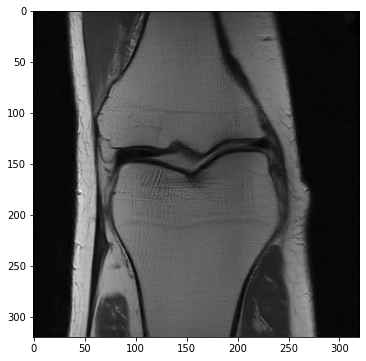

In [11]:
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)
ax.imshow(outputs_[16],"gray")
plt.show()

<a id='sample_test'></a>
# sample test

### load a specific file

In [33]:
filename = "/hdd/multicoil_val/file1000031.h5" #1598.h5" # without fat suppression

f = h5py.File(filename, 'r') # contains a kspace measurement f['kspace'] and rss reconstruction f['reconstruction_rss']
print("Kspace shape (number slices, number coils, x, y): ", f['kspace'].shape)

# which slice to consider in the following
slicenu = f["kspace"].shape[0]//2

slice_ksp = f['kspace'][slicenu]

slice_ksp_torchtensor = transform.to_tensor(slice_ksp)      # Convert from numpy array to pytorch tensor

Kspace shape (number slices, number coils, x, y):  (40, 15, 640, 372)


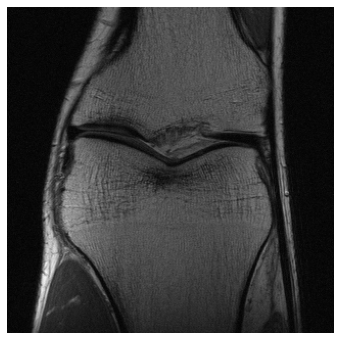

In [34]:
fig = plt.figure(figsize=(6,6))
plt.imshow(f["reconstruction_rss"][slicenu],"gray")
plt.axis("off")
plt.show()

### sample using a random mask

In [35]:
try: # if the file already has a mask
    temp = np.array([1 if e else 0 for e in f["mask"]])
    temp = temp[np.newaxis].T
    temp = np.array([[temp]])
    mask = transform.to_tensor(temp).type(dtype).detach().cpu()
except: # if we need to create a mask
    desired_factor = 4
    undersampling_factor = 0
    tolerance = 0.03
    while undersampling_factor < desired_factor - tolerance or undersampling_factor > desired_factor + tolerance:
        mask_func = MaskFunc(center_fractions=[0.07], accelerations=[desired_factor])  # Create the mask function object
        masked_kspace, mask = transform.apply_mask(slice_ksp_torchtensor, mask_func=mask_func)   # Apply the mask to k-space
        mask1d = var_to_np(mask)[0,:,0]
        undersampling_factor = len(mask1d) / sum(mask1d)

mask1d = var_to_np(mask)[0,:,0]

# The provided mask and data have last dim of 368, but the actual data is smaller.
# To prevent forcing the network to learn outside the data region, we force the mask to 0 there.
#mask1d[:mask1d.shape[-1]//2-160] = 0 
#mask1d[mask1d.shape[-1]//2+160:] =0
mask2d = np.repeat(mask1d[None,:], slice_ksp.shape[1], axis=0).astype(int) # Turning 1D Mask into 2D that matches data dimensions
mask2d = np.pad(mask2d,((0,),((slice_ksp.shape[-1]-mask2d.shape[-1])//2,)),mode='constant') # Zero padding to make sure dimensions match up
mask = transform.to_tensor( np.array( [[mask2d[0][np.newaxis].T]] ) ).type(dtype).detach().cpu()

In [36]:
print("undersampling factor:",len(mask1d)/sum(mask1d))

undersampling factor: 4.0


In [37]:
masked_kspace, mask = transform.apply_mask(slice_ksp_torchtensor, mask = mask)
unders_measurement = np_to_var( masked_kspace.data.cpu().numpy() ).type(dtype)
sampled_image = transform.ifft2(masked_kspace)

### prepare the input for UNET

In [38]:
image = transforms.ifft2(masked_kspace)
# Crop input image to given resolution if larger
smallest_width = min(320, image.shape[-2])
smallest_height = min(320, image.shape[-3])

crop_size = (smallest_height, smallest_width)
image = transforms.complex_center_crop(image, crop_size)
# Absolute value
image = transforms.complex_abs(image)
# Apply Root-Sum-of-Squares if multicoil data
image = transforms.root_sum_of_squares(image)
# Normalize input
image, mean, std = transforms.normalize_instance(image, eps=1e-11)
image = image.clamp(-6, 6)

### get the output

In [39]:
out = umdl( torch.from_numpy(np.array([image.data.cpu().numpy()])).type(dtype) )

In [40]:
out_np = out.data.cpu().numpy()[0]

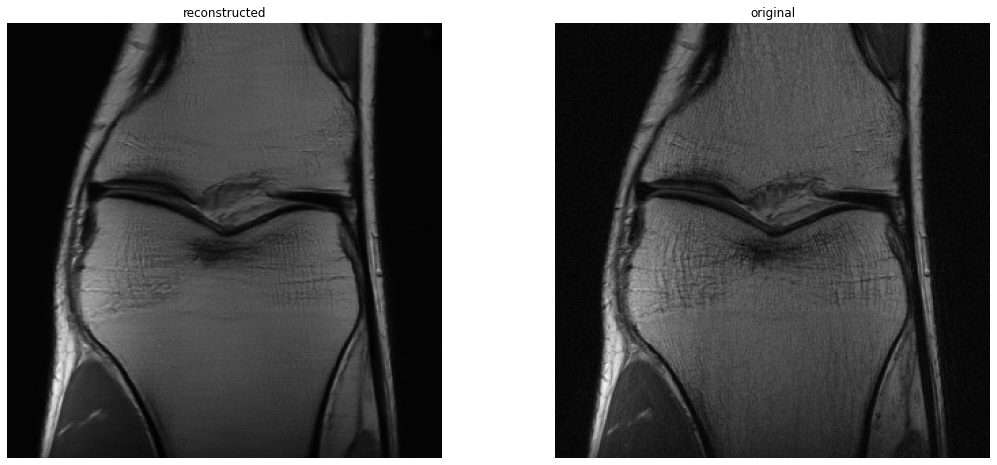

In [41]:
fig = plt.figure(figsize=(18,8))
ax = fig.add_subplot(1,2,1)
ax.imshow(out_np,"gray")
ax.set_title("reconstructed")
ax.axis("off")

ax = fig.add_subplot(1,2,2)
ax.imshow(f["reconstruction_rss"][slicenu],"gray")
ax.set_title("original")
ax.axis("off")

plt.show()

In [1]:
import pickle
with open("files","rb") as fn:
    fff = pickle.load(fn)

In [44]:
import pickle
with open("./validation_results/convD_256/file1000031_ConvD","rb") as fn:
    conv = pickle.load(fn)["reconstructed image"]

In [45]:
conv.shape

(320, 320)

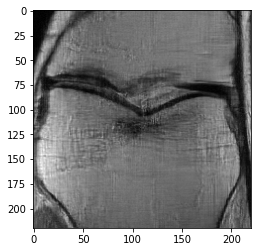

In [46]:
a = 50
plt.imshow(conv[a:-a,a:-a],"gray")

In [24]:
tv = h5py.File("./TV/file1000031.h5")["reconstruction"]

In [25]:
tv.shape

(40, 320, 320)

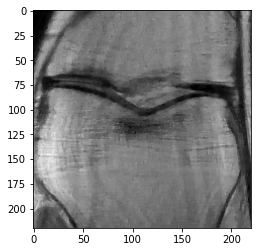

In [51]:
a = 50
plt.imshow(tv[tv.shape[0]//2][a:-a,a:-a],"gray")

In [52]:
imgs = [out_np,tv[tv.shape[0]//2],conv,orig]
archs = ["tunet","ttv","tconv","torig"]

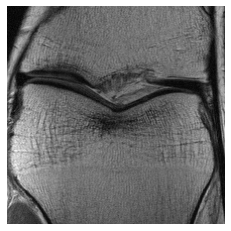

In [53]:
a = 50
for arch,img in zip(archs,imgs):
    plt.imshow(img[a:-a,a:-a], cmap='gray')#, vmin=0, vmax=1)
    plt.axis("off")
    plt.savefig('validation_results/unet_tv_chosen_images/z{}.eps'.format(arch), dpi=100, format='eps',bbox_inches="tight",pad_inches=0)

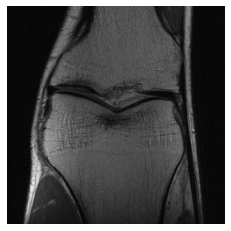

In [54]:
for arch,img in zip(archs,imgs):
    plt.imshow(img, cmap='gray')#, vmin=0, vmax=1)
    plt.axis("off")
    plt.savefig('validation_results/unet_tv_chosen_images/{}.eps'.format(arch), dpi=100, format='eps',bbox_inches="tight",pad_inches=0)

In [29]:
im3 = imgs[1]
im3 = hist_match(im3,orig)
ssim(np.array([orig]),np.array([im3]))

0.7856094695339938

### SSIM, MS-SSIM, and VIF scores

In [48]:
orig = f["reconstruction_rss"][slicenu]
orig = transforms.to_tensor(orig)
orig = transforms.center_crop(orig, (320,320))
orig = transforms.normalize(orig, mean, std, eps=1e-11)
#orig = torch.from_numpy(orig)
orig = orig.clamp(-6, 6)
orig = orig.data.cpu().numpy()

##### balance the dynamic range for score computation #####
mean = mean.data.cpu().numpy()[np.newaxis][0]
std = std.data.cpu().numpy()[np.newaxis][0]

In [51]:
##### scores ######
im1 = orig*std+mean
im2 = out_np*std+mean
im2 = hist_match(im2,im1)

ssim_const = ssim(np.array([im1]),np.array([im2]))
sd = torch.FloatTensor
ms_ssim_const = ms_ssim(torch.tensor([[im1]]).type(sd), torch.tensor([[im2]]).type(sd), data_range=im1.max())
print("SSIM:{}, MS-SSIM:{}".format(ssim_const,ms_ssim_const))

SSIM:0.8574764229202718, MS-SSIM:0.9697471857070923


In [49]:
im1 = (im1-im1.min())/(im1.max()-im1.min())
im2 = (im2-im2.min())/(im2.max()-im2.min())
print("VIF:",vifp_mscale(im1*255/im1.max(),im2*255/im2.max()))

VIF: 0.8251180609406544


# ConvD vs. PConvD vs. U-net

In [66]:
results = {}
#outpath = "./validation_results/convD_256/*"
outpath = "./validation_results/DD_DIP_ParallelConvDecoder/*parallel ConvD"

files = glob.glob(outpath)
random.shuffle(files)
files = files[:20]

In [67]:
import pickle
for file in files:
    with open(file,"rb") as fn:
        data = pickle.load(fn)
    if data["file"] in results:
        results[data["file"]].append(data)
    else:
        results[data["file"]] = [data]

pres = []
for file in results:
    pres.append(results[file][0]["reconstructed image"])

In [68]:
outpathc = "./validation_results/convD_256/"
conres = []
for file in results:
    with open(outpathc + file + "_ConvD","rb") as fn:
        data = pickle.load(fn)
    conres.append(data["reconstructed image"])

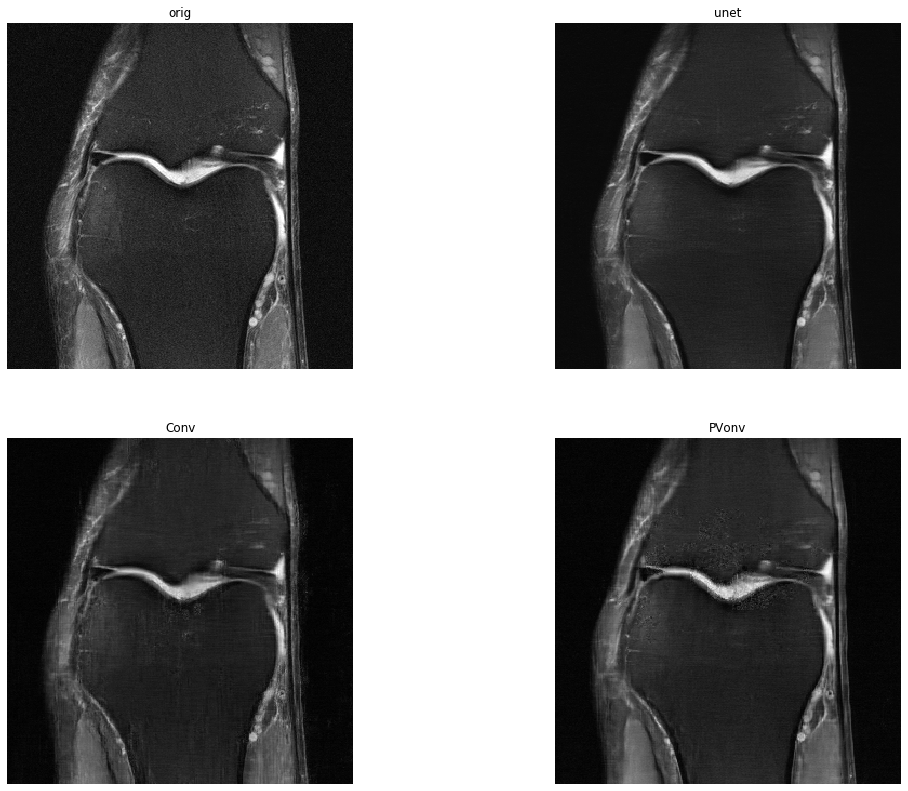

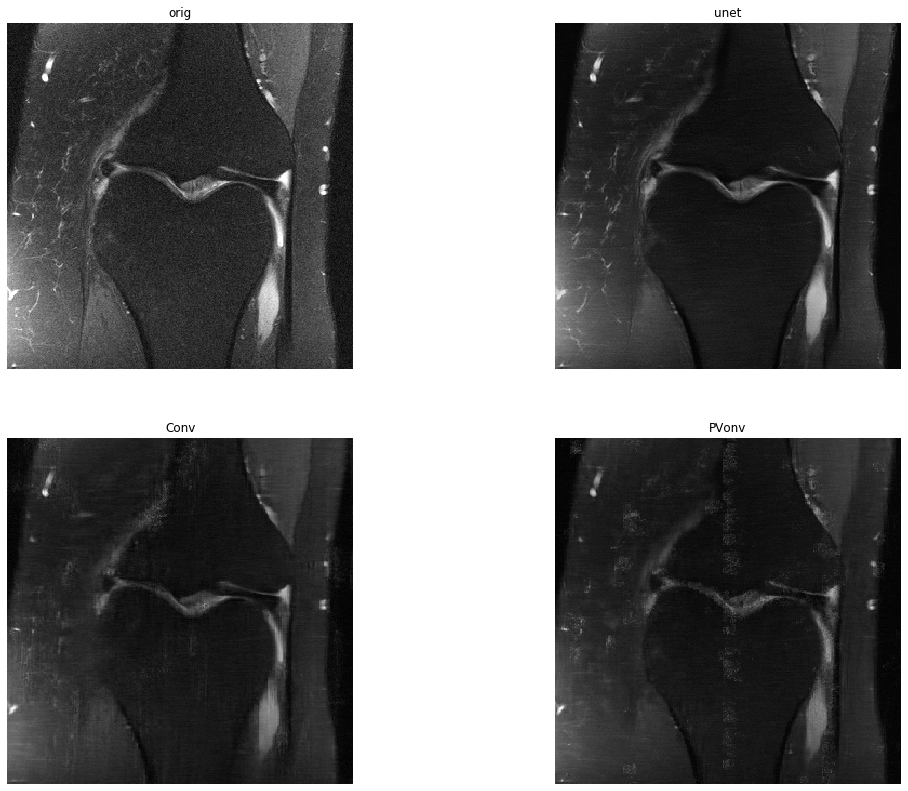

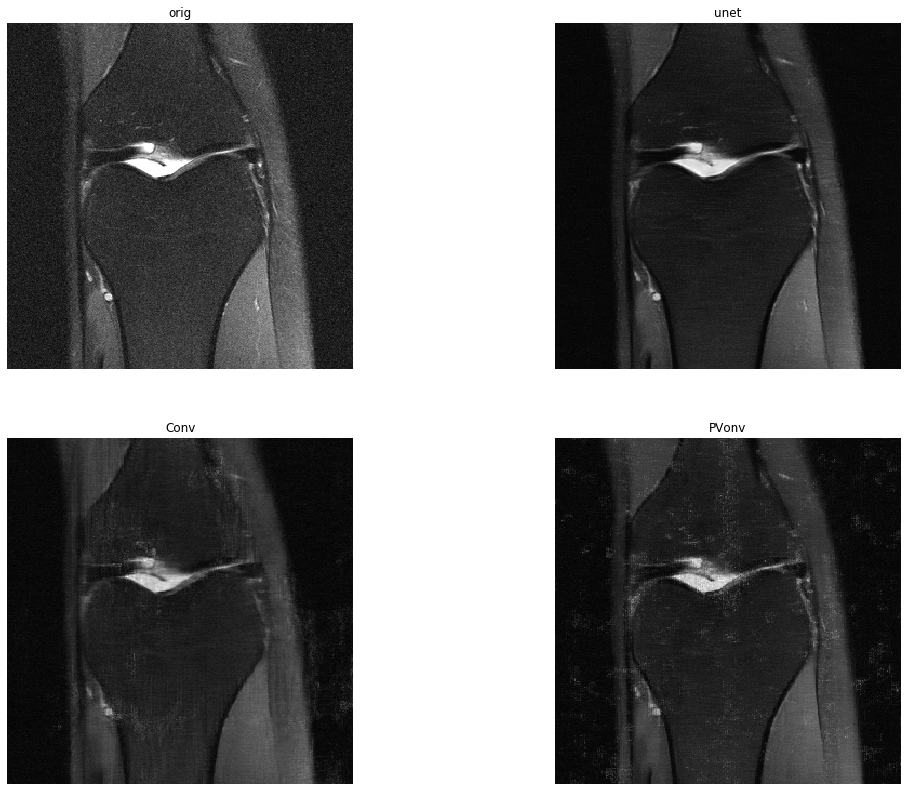

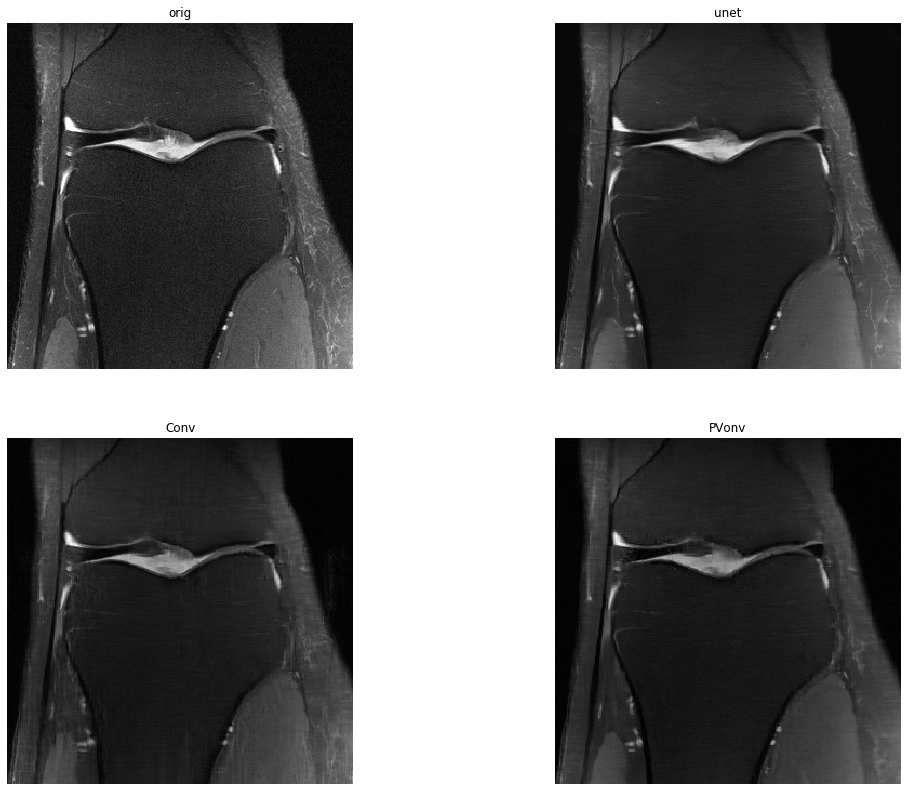

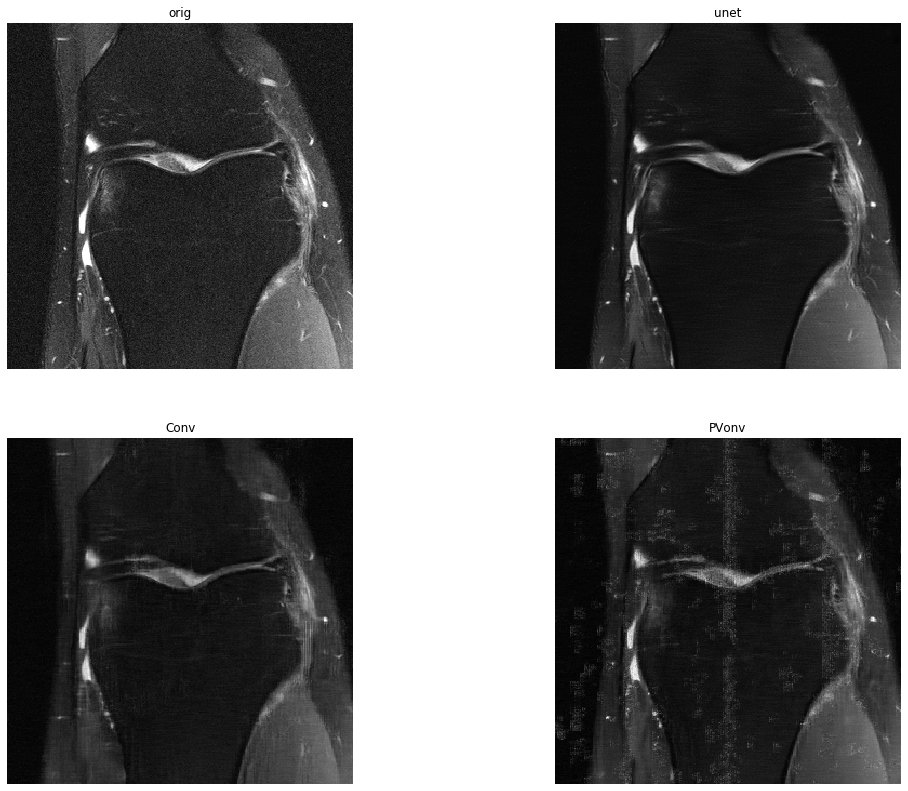

...

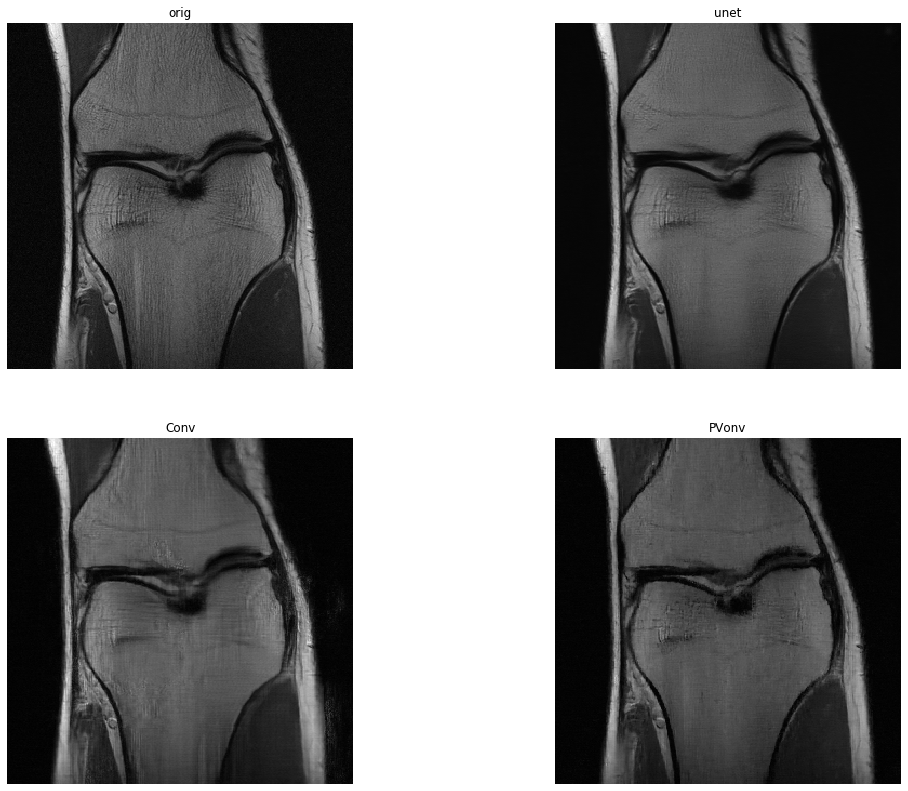

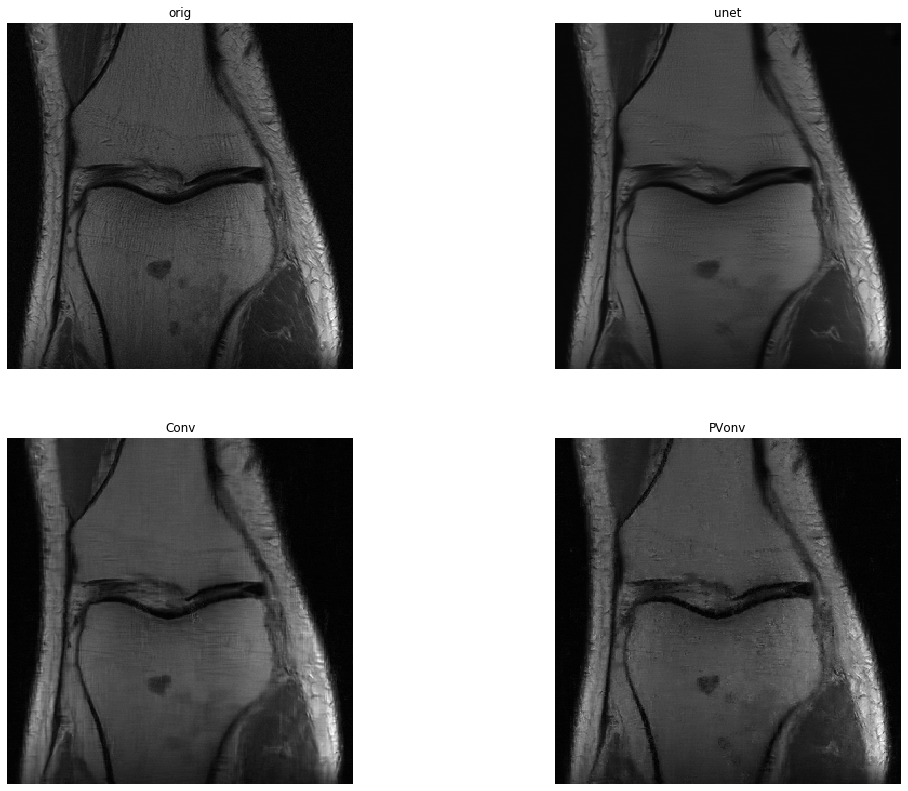

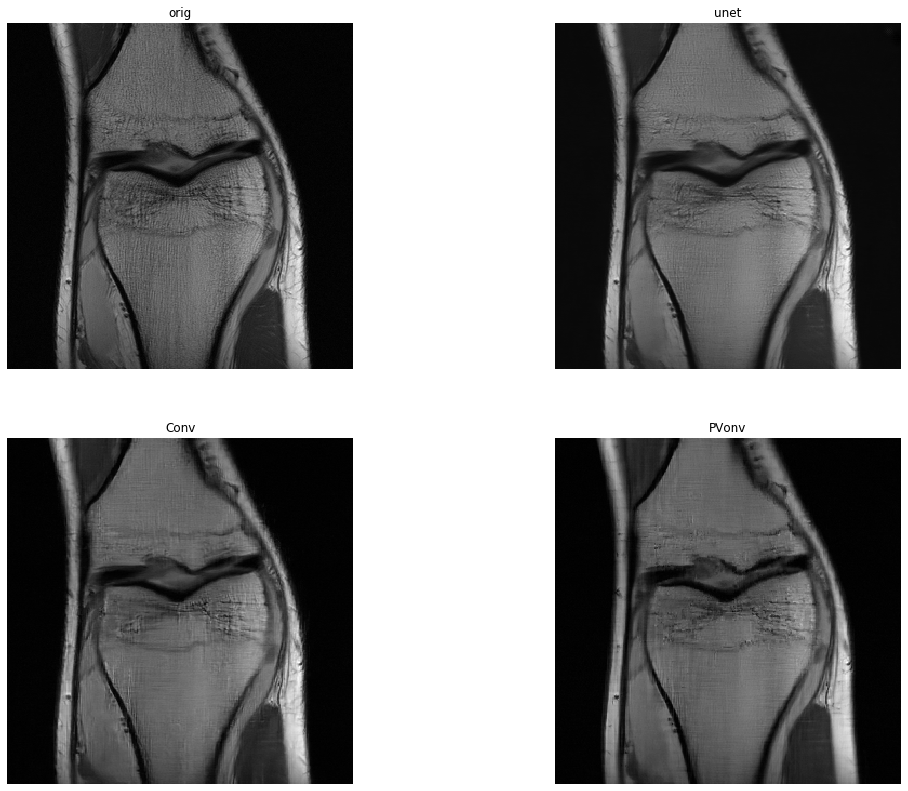

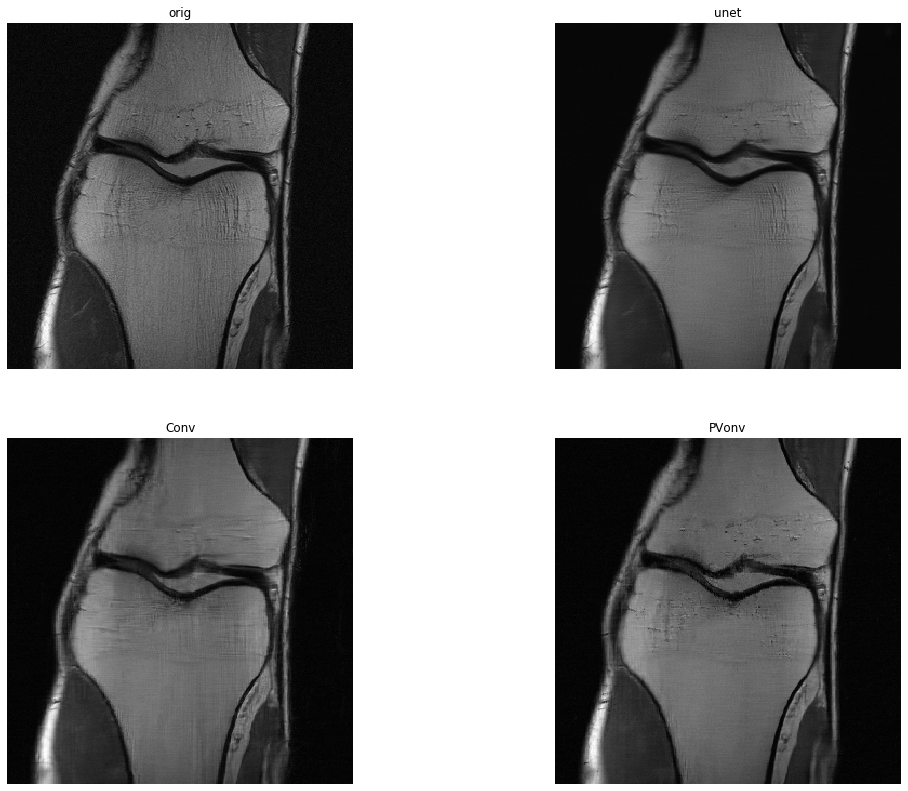

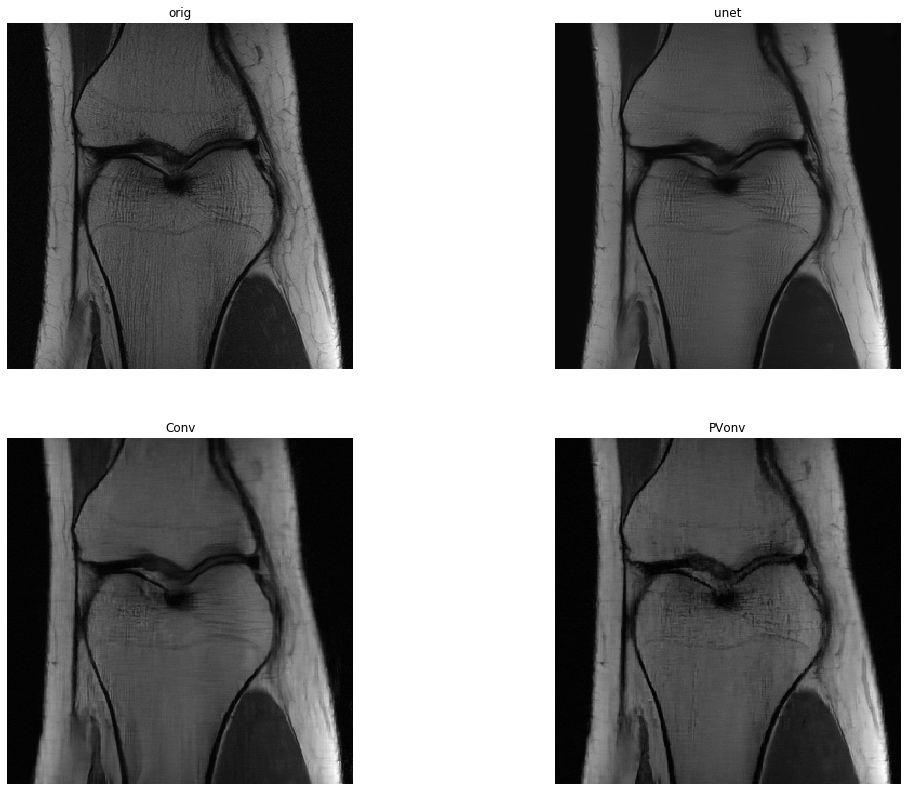

In [70]:
SSIMs = []

for i,filename in enumerate(results.keys()):
    S = []
    ##### load #####
    filename = "/hdd/multicoil_val/" + filename + ".h5"
    f = h5py.File(filename, 'r') # contains a kspace measurement f['kspace'] and rss reconstruction f['reconstruction_rss']
    
    # which slice to consider in the following
    slicenu1 = f["kspace"].shape[0]//2
    
    st = []
    outputs = []
    targets = [] 
    
    for slicenu in range(f["kspace"].shape[0]):
        if slicenu != slicenu1:
            continue
        slice_ksp = f['kspace'][slicenu]
        slice_ksp_torchtensor = transform.to_tensor(slice_ksp)      # Convert from numpy array to pytorch tensor

        ##### create a random mask #####
        try: # if the file already comes with a mask
            temp = np.array([1 if e else 0 for e in f["mask"]])
            temp = temp[np.newaxis].T
            temp = np.array([[temp]])
            mask = transform.to_tensor(temp).type(dtype).detach().cpu()
        except: # if we need to create a mask
            desired_factor = 4
            undersampling_factor = 0
            tolerance = 0.03
            while undersampling_factor < desired_factor - tolerance or undersampling_factor > desired_factor + tolerance:
                mask_func = MaskFunc(center_fractions=[0.07], accelerations=[desired_factor])  # Create the mask function object
                masked_kspace, mask = transform.apply_mask(slice_ksp_torchtensor, mask_func=mask_func)   # Apply the mask to k-space
                mask1d = var_to_np(mask)[0,:,0]
                undersampling_factor = len(mask1d) / sum(mask1d)

        mask1d = var_to_np(mask)[0,:,0]

        # The provided mask and data have last dim of 368, but the actual data is smaller.
        # To prevent forcing the network to learn outside the data region, we force the mask to 0 there.
        #mask1d[:mask1d.shape[-1]//2-160] = 0 
        #mask1d[mask1d.shape[-1]//2+160:] =0
        mask2d = np.repeat(mask1d[None,:], slice_ksp.shape[1], axis=0).astype(int) # Turning 1D Mask into 2D that matches data dimensions
        mask2d = np.pad(mask2d,((0,),((slice_ksp.shape[-1]-mask2d.shape[-1])//2,)),mode='constant') # Zero padding to make sure dimensions match up
        mask = transform.to_tensor( np.array( [[mask2d[0][np.newaxis].T]] ) ).type(dtype).detach().cpu()

        #f.close()

        ##### sample the k-space #####
        masked_kspace, mask = transform.apply_mask(slice_ksp_torchtensor, mask = mask)
        unders_measurement = np_to_var( masked_kspace.data.cpu().numpy() ).type(dtype)

        ##### prepare the input for UNET #####
        image = transforms.ifft2(masked_kspace)
        # Crop input image to given resolution if larger
        smallest_width = min(320, image.shape[-2])
        smallest_height = min(320, image.shape[-3])

        crop_size = (smallest_height, smallest_width)
        image = transforms.complex_center_crop(image, crop_size)
        # Absolute value
        image = transforms.complex_abs(image)
        # Apply Root-Sum-of-Squares if multicoil data
        image = transforms.root_sum_of_squares(image)
        # Normalize input
        image, mean, std = transforms.normalize_instance(image, eps=1e-11)
        image = image.clamp(-6, 6)

        ### normalize target
        orig = f["reconstruction_rss"][slicenu]
        orig = transforms.to_tensor(orig)
        orig = transforms.center_crop(orig, (320,320))
        orig = transforms.normalize(orig, mean, std, eps=1e-11)
        #orig = torch.from_numpy(orig)
        orig = orig.clamp(-6, 6)
        orig = orig.data.cpu().numpy()
        
        ##### get the UNET output #####
        out = umdl( torch.from_numpy(np.array([image.data.cpu().numpy()])).type(dtype) )
        out_np = out.data.cpu().numpy()[0]
        
        ##### balance the dynamic range for score computation #####
        mean = mean.data.cpu().numpy()[np.newaxis][0]
        std = std.data.cpu().numpy()[np.newaxis][0]
        ##### scores ######
        im1 = orig*std+mean
        im2 = out_np*std+mean
        
        
        fig = plt.figure(figsize=(18,14))
        ax = fig.add_subplot(221)
        ax.imshow(orig,"gray")
        ax.axis("off")
        ax.set(title="orig")
        
        im1 = (im1-im1.mean()) / (im1.std())
        im1 *= im2.std()
        im1 += im2.mean()
        ssim_const = psnr(np.array([im1]),np.array([im2]))
        S.append(ssim_const)
        ax = fig.add_subplot(222)
        ax.imshow(im2,"gray")
        ax.axis("off")
        ax.set(title="unet")# {}".format(round(ssim_const,4)))
        
        im1 = orig.copy()
        im2 = conres[i]
        im1 = (im1-im1.mean()) / (im1.std())
        im1 *= im2.std()
        im1 += im2.mean()
        ssim_const = psnr(np.array([im1]),np.array([im2]))
        S.append(ssim_const)
        ax = fig.add_subplot(223)
        ax.imshow(im2,"gray")
        ax.axis("off")
        ax.set(title="Conv")# {}".format(round(ssim_const,4)))
        
        im1 = orig.copy()
        im2 = pres[i]
        im1 = (im1-im1.mean()) / (im1.std())
        im1 *= im2.std()
        im1 += im2.mean()
        ssim_const = psnr(np.array([im1]),np.array([im2]))
        S.append(ssim_const)
        ax = fig.add_subplot(224)
        ax.imshow(im2,"gray")
        ax.axis("off")
        ax.set(title="PVonv")# {}".format(round(ssim_const,4)))
        plt.show()
        
        SSIMs.append(S)
    print('\n'*2)

In [65]:
SSIMs = np.array(SSIMs)
scores = {"unet":SSIMs.mean(0)[0],"conv":SSIMs.mean(0)[1],"pconv":SSIMs.mean(0)[2]}
scores

{'unet': 32.38951337802252,
 'conv': 30.621563434415133,
 'pconv': 30.813006757770363}